# 5. Capstone Project: Exploratory Data Analysis

***

![headerall](./images/headers/header_all.jpg)


### Project:
In this work, we will first analyze where and when traffic congestion is highest and lowest in New York State. We will then build different machine learning models capable of predicting cab travel times in and around New York City using only variables that can be easily obtained from a smartphone app or a website. We will then compare their performance and explore the possibility of using additional variables such as weather forecasts and holidays to improve the predictive performance of the models.


### Section:
In this section, we will detect and describe patterns, trends, and relationships among geospatial and temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify variables that may impact traffic flow, and thus trip duration, in and around New York City.

## Data
### External Datasets:
- Weather Forecast: The 2018 NYC weather forecast was collected from the [National Weather Service Forecast Office](https://w2.weather.gov/climate/index.php?wfo=okx) website. Daily measurements were taken from January to December 2018 in Central Park. These measures are given in imperial units and include daily minimum and maximum temperatures, precipitations, snowfall, and snow depth.

- Holidays: The 2018 NYC holidays list was collected from the [Office Holiday](https://www.officeholidays.com/countries/usa/new-york/2021) website. The dataset contains the name, date, and type of holidays for New York.

- Taxi Zones: The NYC Taxi Zones dataset was collected from the [NYC Open Data](https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc) website. It contains the pickup and drop-off zones (Location IDs) for the Yellow, Green, and FHV Trip Records. The taxi zones are based on the NYC Department of City Planning’s Neighborhood.

### Primary Datasets:

- Taxi Trips: The 2018 NYC Taxi Trip dataset was collected from the [Google Big Query](https://console.cloud.google.com/marketplace/product/city-of-new-york/nyc-tlc-trips?project=jovial-monument-300209&folder=&organizationId=) platform. The dataset contains more than 100'000'000 Yellow Taxi Trip records for 2018 and contains an extensive amount of variables including the pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts.

***
## Table of Content:

    1. Data Preparation
        1.1 External Datasets
            1.1.1 Weather Forecast Dataset
            1.1.2 Holidays Dataset
            1.1.3 Taxi Zones Dataset
        1.2 Primary Dataset
            1.2.1 Taxi Trips Dataset
    2. Exploratory Data Analysis
        2.1 Primary Dataset
            2.1.1 Temporal Analysis
            2.1.2 Spatio-Temporal Analysis
        2.2 External Datasets
            2.2.1 Temporal Analysis of Weather Data
            2.2.2 Temporal Analysis of Holidays Data
        2.3 Combined Dataset
            2.3.1 Overall Features Correlation
    3. Machine Learning Models

***
## Python Libraries and Magic commands Import

In [1]:
# Import python core libraries
import itertools

# Import data processing libraries
import numpy as np
import pandas as pd

# Import Visualization librairies
import contextily as ctx
import seaborn as sns
import matplotlib.pyplot as plt

# Import machine learning libraries
from sklearn.model_selection import train_test_split

In [2]:
# Set up magic commands
%matplotlib inline
%config Completer.use_jedi = False

***
## Data Import

In [3]:
# Import the train dataset
train_df = pd.read_pickle(r'data/processed/train.pickle')

# Import the test dataset
test_df = pd.read_pickle(r'data/processed/test.pickle')

# Import the weather forecasts dataset
weather_df = pd.read_pickle(r'data/processed/weather.pickle')

# Import the holidays dataset
holidays_df = pd.read_pickle(r'data/processed/holidays.pickle')

# Import the zones dataset
zones_df = pd.read_pickle(r'data/processed/zones.pickle')

***
## Variables Import

In [4]:
# List of boroughs
boroughs = ["EWR", "Queens", "Bronx", "Manhattan", "Staten Island", "Brooklyn"]

# List of week days
weekdays = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

# List of Holidays
holidays_type = [
    "Not A Public Holiday",
    "School Holiday",
    "Government Holiday",
    "Federal Holiday",
]

***
## Functions import

In [5]:
# Define a function that transform column headers to titles
def to_title(data, sep="_"):
    return [s.replace(sep, " ").title() for s in data]

In [6]:
# Define a function that display a correlation heatmap
def plot_corrmap(data, figsize=(20, 20), palette="YlGnBu_r"):
    # Create a figure with one column and row
    _, ax =plt.subplots(figsize=figsize)

    # Generate the plot
    sns.heatmap(
        data,
        ax=ax,
        cmap=palette,
        annot=True,
        center=0,
        square=True,
        linewidths=0.5,
        cbar_kws={"shrink": 0.5},
    )

    # Display the figure
    plt.show()

In [7]:
# Define a function that display a heatmap
def plot_heatmap(
    data,
    xticks,
    yticks,
    xlabel,
    ylabel,
    xlim=0,
    figsize=(20, 5),
    palette="YlGnBu_r",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    sns.heatmap(data, ax=ax, xticklabels=xticks, yticklabels=yticks, cmap=palette)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.set_xticklabels(ax.get_xticklabels(), va="center")
    ax.set_yticklabels(ax.get_yticklabels(), va="center")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.set_xlim(xlim)
    ax.invert_yaxis()
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [8]:
# Define a function that display individual scatterplot
def plot_scatterplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,

    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.scatterplot(x=x_var, y=y_var, data=data, ax=ax, palette=palette)
    else:
        sns.scatterplot(
            x=x_var,
            y=y_var,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.set_xscale('log')
    ax.grid()
    
    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [9]:
# Define a function that display individual barplot
def plot_lineplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,
    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.lineplot(
            x=x_var,
            y=y_var,
            data=data,
            ax=ax,
            palette=palette,
        )
    else:
        sns.lineplot(
            x=x_var,
            y=y_var,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [10]:
# Define a function that display individual barplot
def plot_barplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,
    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.barplot(
            x=x_var,
            y=y_var,
            data=data,
            ax=ax,
            palette=palette,
        )
    else:
        sns.barplot(
            x=x_var,
            y=y_var,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [11]:
# Define a function that display individual stack barplot
def plot_stackedplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,
    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.barplot(
            x=x_var,
            y=y_var,
            kind="bar",
            stacked=True,
            data=data,
            ax=ax,
            palette=palette,
        )
    else:
        sns.plot(
            x=x_var,
            y=y_var,
            kind="bar",
            stacked=True,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [12]:
# Define a function that display individual barplot
def plot_boxplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    sns.boxplot(
        x=x_var,
        y=y_var,
        data=data,
        ax=ax,
        width=0.5,
        linewidth=0.75,
        palette="YlGnBu",
    )
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [13]:
def plot_clockhist(
    data,
    columns,
    colnames,
    title,
    ylim,
    yticks,
    yticklabels,
    nrows=1,
    ncols=1,
    palette="YlGnBu",
):

    # Get the color palette
    cpal = itertools.cycle(sns.color_palette(palette, len(columns)))

    # Create a figure with n columns and rows
    fig, axes = plt.subplots(
        ncols=ncols,
        nrows=nrows,
        figsize=(5 * ncols, 5 * nrows),
        subplot_kw=dict(projection="polar"),
    )

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Define theta for 24 hours
    theta = np.linspace(0, 2 * np.pi, 24, endpoint=False)

    # Define the width of each bin
    width = np.divide(np.multiply(2, np.pi), 24)

    # Generate the plots
    for ax, col, colname, color in zip(axes, columns, colnames, cpal):
        ax.bar(
            theta,
            data[col],
            width=width,
            align="edge",
            linewidth=0.25,
            color=color,
            edgecolor="dimgrey",
        )
        ax.set_theta_direction(-1)
        ax.set_theta_zero_location("N")
        ax.set_ylim(0, ylim)
        ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))
        ax.set_yticks(yticks)
        ax.set_xticklabels(
            [f"{x}:00" for x in np.arange(0, 24, 3)],
            rotation="vertical",
            fontsize=12,
        )
        ax.set_yticklabels(
            yticklabels, rotation="vertical", fontsize=12
        )
        ax.set_title(colname, fontsize=16)
        ax.set_axis_on()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=1, w_pad=1)

    # Adding a title to the plot
    plt.suptitle(title, y=1.10, fontsize=18)

    # Display the plot
    plt.show()

In [14]:
def plot_map(
    data,
    columns,
    colnames,
    nrows=1,
    ncols=1,
    legend=True,
    figsize=(20, 5),
    palette="YlGnBu_r",
):
    # Creat a figure with n rows and one columns
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        constrained_layout=True,
        sharex=True,
        sharey=True,
        subplot_kw=dict(aspect="equal"),
    )

    # Get the min from selected columns in the data frame
    vmin = np.min([data[c].min() for c in columns])

    # Get the max from selected columns in the data frame
    vmax = np.max([data[c].max() for c in columns])

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Generate the plots
    for ax, col, colname in zip(axes, columns, colnames):
        plot = data.plot(
            column=col,
            ax=ax,
            alpha=0.33,
            cmap=sns.color_palette(palette, as_cmap=True),
            edgecolor="k",
            linewidth=0.33,
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(colname, fontsize=18)

        # Add a base map of New York City
        ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

    # assume it's the first (and only) mappable
    cb = fig.colorbar(
        axes[0].collections[0],
        ax=axes,
        shrink=0.5,
        orientation="horizontal",
    )

    # Display the plot
    plt.show()

***
## 2.1 Exploratory Data Analysis: Primary Dataset
## 2.1.1 Primary Dataset: Temporal Analysis
### Goal:
Detect and describe patterns, trends, and relationships among temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify variables that may impact traffic flow, and thus trip duration, in and around New York City.
### Code:

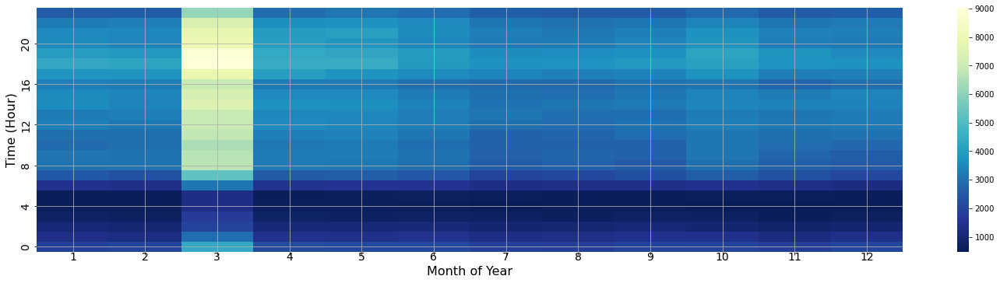

In [15]:
# Group taxi trips by pickup month of year and hour of day
# Compute the number of taxi trips
monthly_rides = (
    train_df.groupby(["pickup_month", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup month column
monthly_rides_pvt = monthly_rides.pivot(
    index="pickup_hour", columns="pickup_month", values="count"
)

# Display a heatmap of taxi trips by month of year and day time
plot_heatmap(
    monthly_rides_pvt,
    xticks=1,
    yticks=4,
    xlabel="Month of Year",
    ylabel="Time (Hour)",
)

**Notes:** The heat map above shows the number of taxi trips by month and time. The largest increase in the number of trips is observed in March, while the months of July through September, and November through December show a slight decrease compared to the rest of the year. Looking at the hourly scale, we observe that the number of hourly runs starts to decrease rapidly after midnight and increases again around 18:00. The largest daily increase is reached around 19:00. 

**Warnings:** The number of taxi trips is corresponds to 0.8% of the whole dataset.

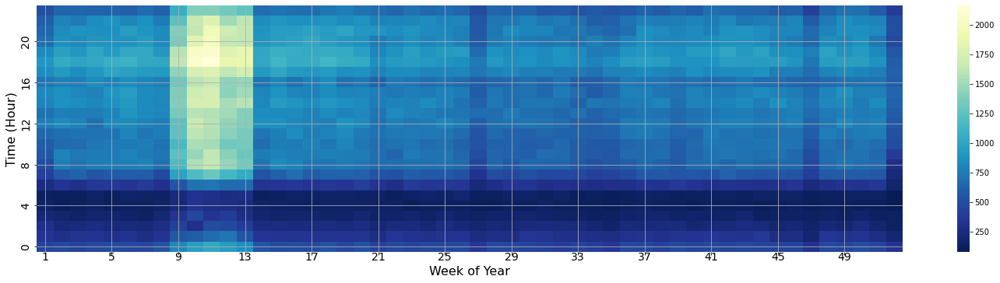

In [16]:
# Group taxi trips by pickup week of year and hour of day
# Compute the number of taxi trips
weekly_rides = (
    train_df.groupby(["pickup_week", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup week column
weekly_rides_pvt = weekly_rides.pivot(
    index="pickup_hour", columns="pickup_week", values="count"
)

# Display a heatmap of taxi trips by week of year and time
plot_heatmap(
    weekly_rides_pvt,
    xticks=4,
    yticks=4,
    xlabel="Week of Year",
    ylabel="Time (Hour)",
)

**Notes:** The heat map above shows the number of taxi trips by week and time. As previously noted, the largest increase in trips is seen in March and specifically from week 9 to week 13. This increase coincides with the start and end of spring break - a national school vacation whose start and end date depends on the state, but which typically begins in late February and ends in late March. The week following the national holiday of July 14 (week 27), the week of Thanksgiving (week 47), and New Year's Eve (week 53) may also account for some of the slight declines observed in July, November, and December 2018. 

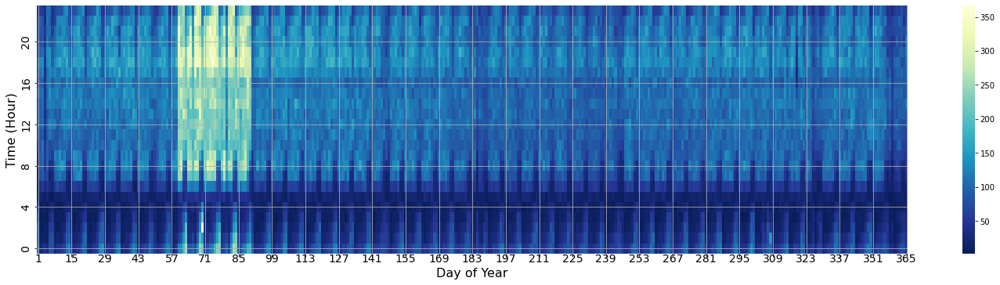

In [17]:
# Group taxi trips by pickup day of year and hour of day
# Compute the number of taxi trips
daily_rides = (
    train_df.groupby(["pickup_yearday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup year day column
daily_rides_pvt = daily_rides.pivot(
    index="pickup_hour", columns="pickup_yearday", values="count"
)

# Display a heatmap of taxi trips by day of year and time
plot_heatmap(
    daily_rides_pvt,
    xticks=14,
    yticks=4,
    xlabel="Day of Year",
    ylabel="Time (Hour)",
)

**Notes:** The heat map above shows the number of taxi trips by day and hour. Examination of the data at the daily and hourly scales reveals two different patterns: on weekdays, the number of hourly trips begins to decline rapidly after midnight and increases again around 6:00 a.m., while on weekends, taxi trips remain high until 16:00 and decline significantly between 5:00 and 8:00. On weekdays, the largest daily increase is reached around 19:00, while on weekends the number of trips is relatively stable throughout the day and until late at night.

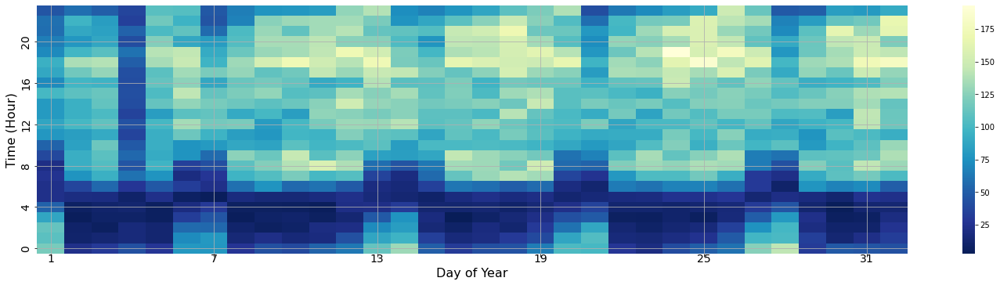

In [18]:
# Display a heatmap of taxi trips by day of year and time for first 31 days of the year
plot_heatmap(
    daily_rides_pvt.iloc[:, 0:32],
    xticks=6,
    yticks=4,
    xlabel="Day of Year",
    ylabel="Time (Hour)",
)

**Notes:** The heat map above shows the number of taxi trips by day and hour for the first 31 days of the year. The number of rides appears to drop sharply from Saturday to Sunday. In addition, on January 4, 2018, New York City was hit hard by a powerful cyclonic blizzard, which caused many disruptions.

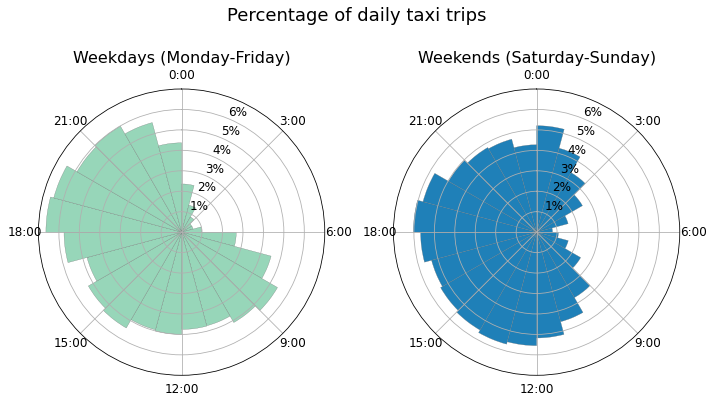

In [19]:
# Group taxi trips by pickup weekday type and hour of day
# Compute the number of taxi trips
hourly_rides = (
    train_df.groupby(["pickup_weekday_type", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Get a subset of the data frame where the pickup weekday type is 0 (Weekdays)
hourly_rides_week = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 0, ["pickup_hour", "count"]
]

# Get a subset of the data frame where the pickup weekday type is 1 (Weekends)
hourly_rides_weekend = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 1, ["pickup_hour", "count"]
]

# Compute the percentage of daily ride for each hour of the day (Weekdays)
hourly_rides_week["percent"] = (
    np.divide(hourly_rides_week["count"], hourly_rides_week["count"].sum()) * 100
)

# Compute the percentage of daily ride for each hour of the day (Weekends)
hourly_rides_weekend["percent"] = (
    np.divide(hourly_rides_weekend["count"], hourly_rides_weekend["count"].sum()) * 100
)

# Merge the two data frames into one
hourly_ride_weektype_df = pd.DataFrame(
    {
        "hourly_rides_week": hourly_rides_week["percent"].to_list(),
        "hourly_rides_weekend": hourly_rides_weekend["percent"].to_list(),
    }
)

# Display circular bar plots of the percentage of daily taxi trip per hour and for weekdays and weekends
plot_clockhist(
    hourly_ride_weektype_df,
    columns=["hourly_rides_week", "hourly_rides_weekend"],
    colnames=[
        "Weekdays (Monday-Friday)",
        "Weekends (Saturday-Sunday)",
    ],
    title="Percentage of daily taxi trips",
    ylim=7.0,
    yticks=np.arange(1, 7, 1),
    yticklabels=[f"{y}%" for y in np.arange(1, 7, 1)],
    ncols=2,
)

**Notes:** The circular bar plots above show the percentage of daily taxi trips on weekdays and weekends. On weekdays, the highest peak is reached around 19:00 and decreases sharply after 21:00. Trips between 00:00 and 06:00 are scarce. In contrast, on weekends the percentage of hourly trips seems to be more evenly distributed throughout the day and night, with a sharp increase in the early morning. Trips between 00:00 and 01:00 are almost frequent than between 19:00 and 20:00 and trips between 01:00 and 02:00 are just sligthly less frequent than during the rest of the day. As expected, New Yorkers tend go out on the weekend from late evening to early morning.

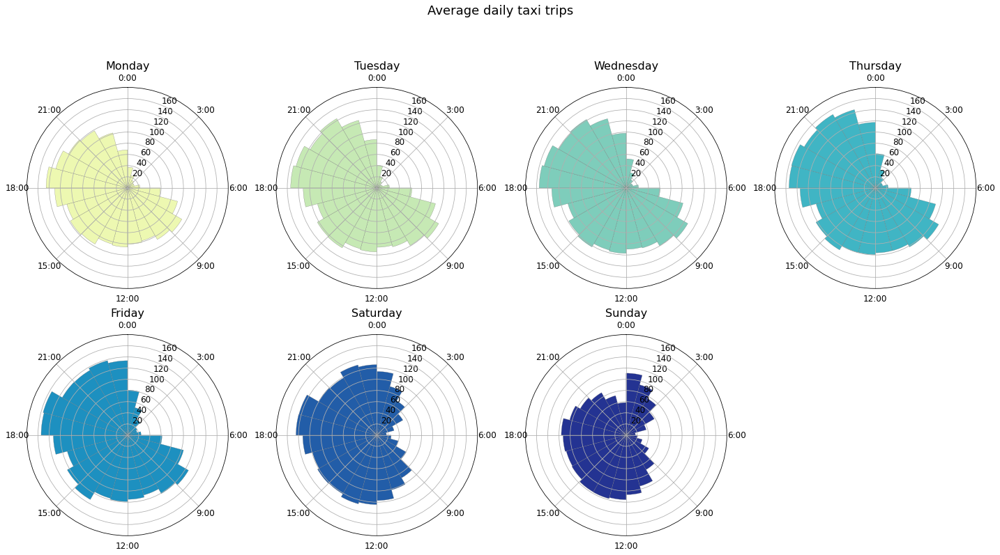

In [20]:
# Group taxi trips by pickup year day, week day, and hour of day
# Compute the number of daily trip
hourly_pickup_count = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Group taxi trips by pickup weekday, and hour of day
# Compute the average number of daily trips
hourly_pickup_count = (
    hourly_pickup_count.groupby(["pickup_weekday", "pickup_hour"])
    .agg({"count": np.mean})
    .reset_index()
)

# Map numerical values to week days
hourly_pickup_count["pickup_weekday"] = hourly_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Pivot the data frame on the pickup week day column
hourly_pickup_count_pvt = hourly_pickup_count.pivot(
    index="pickup_hour", columns="pickup_weekday", values="count"
)


# Display circular bar plots of the average daily taxi trip per hour and for each day of the week
plot_clockhist(
    hourly_pickup_count_pvt,
    columns=[w.lower() for w in weekdays],
    colnames=weekdays,
    title="Average daily taxi trips",
    ylim=180,
    yticks=np.arange(20, 180, 20),
    yticklabels=[f"{y}" for y in np.arange(20, 180, 20)],
    ncols=4,
    nrows=2,
)

**Notes:** The circular bar plots above shows the average number of daily taxi trips for every day of the week. Similar trends are observed from Monday to Friday, but the number of taxi trips increases throughout the week, especially from 6:00 pm to 1:00 am. On Sunday, the number of taxi trips remains stable throughout the day, with a peak between 00:00 and 01:00. As noted earlier, New Yorkers tend to go out on weekends, but less frequently on weekdays. In addition, people seem to take cabs less on Sundays during the day, but continue to go out after midnight.

**Warnings:** The average number of taxi trips is computed on 0.8% of the whole dataset.

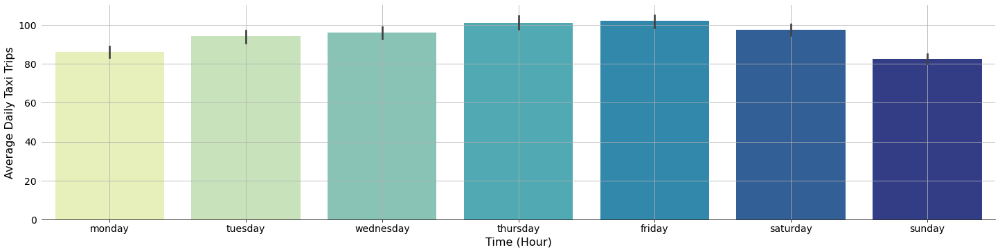

In [21]:
# Group taxi trips by pickup year day, week day, and hour of day
# Compute the number of daily trip
hourly_pickup_count = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to avoid impacting the mean
hourly_pickup_count["count"].replace(0, np.nan, inplace=True)

# Map numerical values to week days
hourly_pickup_count["pickup_weekday"] = hourly_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Display a bar plot of the average number of daily taxi trip
plot_barplot(
    hourly_pickup_count,
    x_var="pickup_weekday",
    y_var="count",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
)

**Notes:** The bar plot above shows the average number of trips per day. As noted earlier, the average number of taxi trips increases from Monday to Friday and then decreases again on weekends, with the largest decrease on Sunday. The closing of offices on weekends may explain the decline in taxi trips on Saturday and Sunday. However, the gradual increase in daily trips from Monday to Friday is more difficult to explain. One hypothesis could be that bars and restaurants open on weekends,close on Mondays.

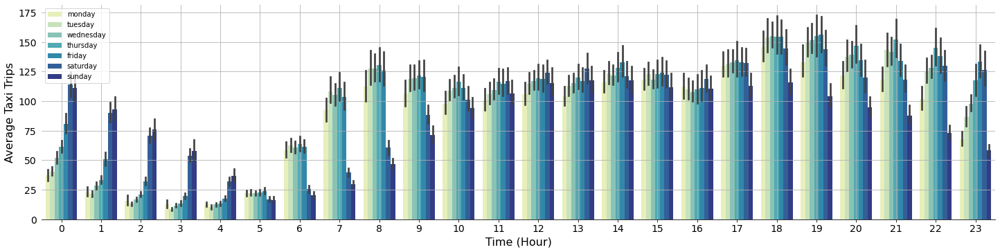

In [22]:
# Display a bar plot of the average number of hourly taxi trip for all week days
plot_barplot(
    hourly_pickup_count,
    x_var="pickup_hour",
    y_var="count",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average Taxi Trips",
)

**Notes:** The bar plot above shows the average number of hourly taxi trips for each day of the week. It appears that the average number of hourly trips can vary significantly throughout the year, especially during peak hours, which begin at 06:00 and end around 21:00. Moreover, the number of trips is not necessarily correlated with traffic fluidity and congestion and thus with trip duration - the variable we are trying to predict. Below we look at the average length, duration and speed of trips on a monthly, daily and hourly scale. Trip speed will be used as an indicator of traffic fluidity/congestion.

In [23]:
# Group taxi trips by pickup year day, month of year, week day, and hour of day
# Compute the mean of trip distances and durations
hourly_pickup_avg = (
    train_df.groupby(["pickup_yearday", "pickup_month", "pickup_weekday", "pickup_hour"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg["trip_speed"] = np.divide(
    hourly_pickup_avg["trip_distance"],
    np.divide(hourly_pickup_avg["trip_duration"], 60),
)

# Map numerical values to week days
hourly_pickup_avg["pickup_weekday"] = hourly_pickup_avg["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Display descriptive statistics of selected columns
hourly_pickup_avg[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


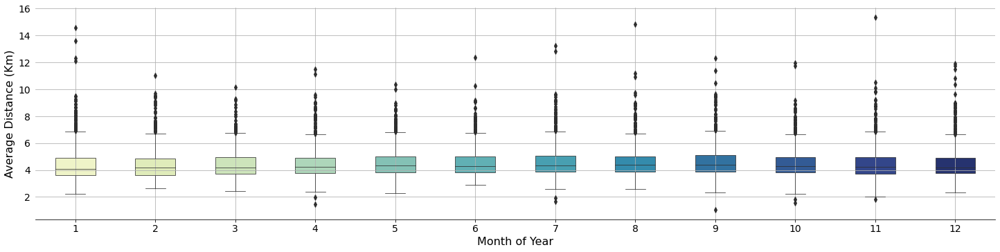

In [24]:
# Display boxplots of average daily trip distance for each month of the year
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_distance",
    xlabel="Month of Year",
    ylabel="Average Distance (Km)",
)

**Notes:** The bar plot above shows the daily average distance traveled for each month of the year. The average trip distance shows no significant changes throughout 2018.

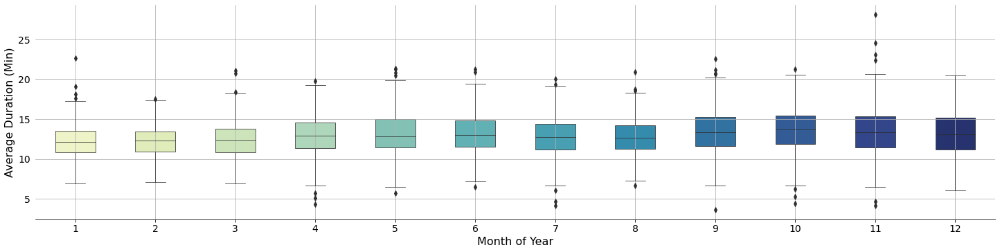

In [25]:
# Display boxplots of average daily trip duration for each month of the year
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_duration",
    xlabel="Month of Year",
    ylabel="Average Duration (Min)",
)

**Notes:** The bar plot above shows the average daily travel time for each month of the year. The average trip duration shows no significant changes throughout 2018.

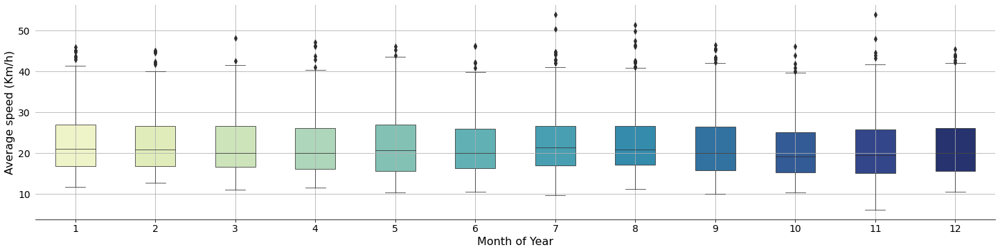

In [26]:
# Display boxplots of average daily trip speed for each month of the year
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_speed",
    xlabel="Month of Year",
    ylabel="Average speed (Km/h)",
)

**Notes:** The bar plot above shows the average daily travel speed for each month of the year. The average trip speed shows no significant changes throughout 2018.

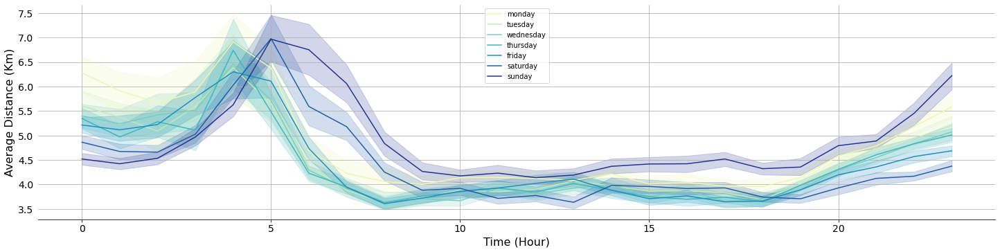

In [27]:
# Display a line plot of average trip distance for each hour of the day and day of the week
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
)

**Notes:** The line plot above shows the average daily distance traveled for each hour of the day and each day of the week. The average distance traveled is significantly lower between 00:00 and 02:00, and significantly higher between 05:00 and 08:00 on Saturdays and Sundays. This may suggest that New Yorkers do not travel to the same locations on weekdays and weekends. We will investigate this assumption at a later stage.

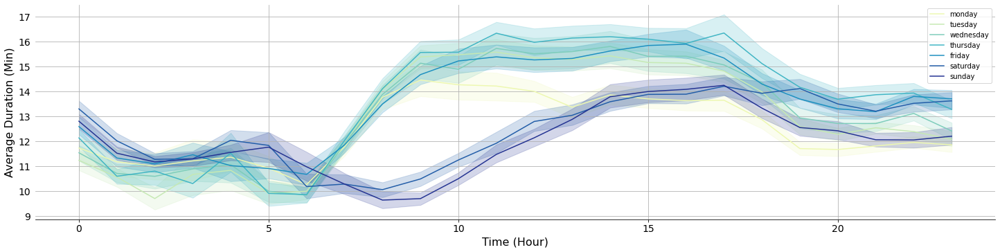

In [28]:
# Display a line plot of average trip duration for each hour of the day and day of the week
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
)

**Notes:** The graph above shows the average daily travel time for each hour of the day and each day of the week. The average travel time is significantly lower on Saturdays and Sundays during peak hours. This may suggest that New Yorkers do not travel to the same places on weekdays and weekends. Another possible interpretation may corroborate our previous observations, namely that fewer taxi trips may be a good indicator of less traffic and potentially better traffic conditions.

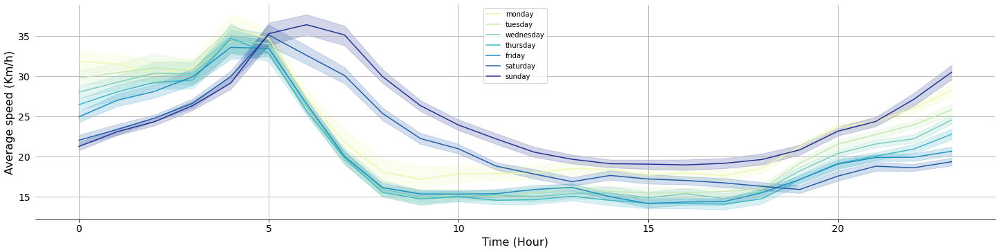

In [29]:
# Display a line plot of average trip speed for each hour of the day and day of the week
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
)

**Notes:** The graph above shows the average daily travel speed for each hour of the day and each day of the week. As a result of higer distance travelled early morning and lower travel durations during rush hour, the average travel speed is significantly higher on the weekends between 06:00 and 11:00.

## 2.1.2 Primary Dataset: Spatio-Temporal Analysis
### Goal:
Detect and describe patterns, trends, and relationships among geospatial and temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify variables that may impact traffic flow, and thus trip duration, in and around New York City.
### Code:

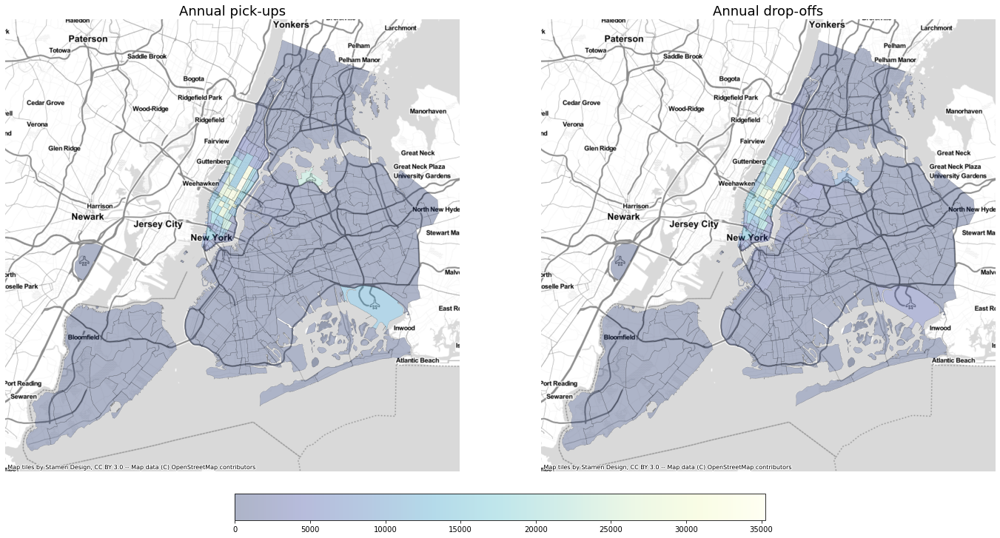

In [30]:
# Group taxi trips by pickup location
# Compute the number of trips
total_pickup_count = (
    train_df.groupby(["pickup_location_id"]).size().to_frame("pickup_all").reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

# Group taxi trips by dropoff location
# Compute the number of trips
total_dropoff_count = (
    train_df.groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

# Merge the pickup location data with the zone data frame
zones_summary_df = pd.merge(zones_df, total_pickup_count, how="left", on="LocationID")

# Merge the dropoff location data with the zone data frame
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count, how="left", on="LocationID"
)

# Fill NaN with zeros to avoid missing locations on the map
zones_summary_df.fillna(0, inplace=True)

# Display heatmaps of the total number of trips by pickup and dropoff locations
plot_map(
    zones_summary_df,
    ["pickup_all", "dropoff_all"],
    ["Annual pick-ups", "Annual drop-offs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Notes:** The above heat maps show the number of annual taxi trips by location. There are no significant differences between arrival and departure locations, with the exception of JFK and LaGuardia airports. Thus, people arriving at airports are more likely to take a cab to New York City than to take one to the airport. In addition, most trips appears to be located made in midtown Manhattan, but drop-off locations are slightly more evenly distributed, including in suburban areas such as Queens, Bronx, and Brooklyn. Manhattan is the heart of New York City with its many stores, bars, and restaurants and is also one of the most densely populated boroughs. As a result, traffic jams are more likely to occur and special attention must be paid to travel times, which are more likely to vary considerably depending on a variety of factors, including holidays and weather conditions.

**Warnings:** The number of taxi trips is computed on 0.8% of the whole dataset.

In [31]:
# Group taxi trips by pickup borough
# Compute the number of trips
total_pickup_borough_count = (
    train_df.groupby(["pickup_borough_id"]).size().to_frame("pickup").reset_index()
).rename(columns={"pickup_borough_id": "borough"})

# Group taxi trips by dropoff borough
# Compute the number of trips
total_dropoff_borough_count = (
    train_df.groupby(["dropoff_borough_id"]).size().to_frame("dropoff").reset_index()
).rename(columns={"dropoff_borough_id": "borough"})

# Merge the pickup and dropoff borough data frame
total_trips_merged = pd.merge(
    total_pickup_borough_count, total_dropoff_borough_count, how="left"
)

# Replace numerical values by the name of the categories
total_trips_merged["borough"] = total_trips_merged["borough"].map(
    dict(zip(np.arange(0, len(boroughs)), boroughs))
)

# Display the whole data frame
total_trips_merged

,borough,pickup,dropoff
0,EWR,1,4
1,Queens,42668,35990
2,Bronx,868,4890
3,Manhattan,771173,750380
4,Staten Island,4,3
5,Brooklyn,10627,34074


**Observation** A closer look at the annual number of pick-ups and drop-offs in each borough shows that the number of dropoffs is significantly higher than pick-ups in Brooklyn and the Bronx. As noted earlier, drop-off locations are more evenly distributed throughout New York State.

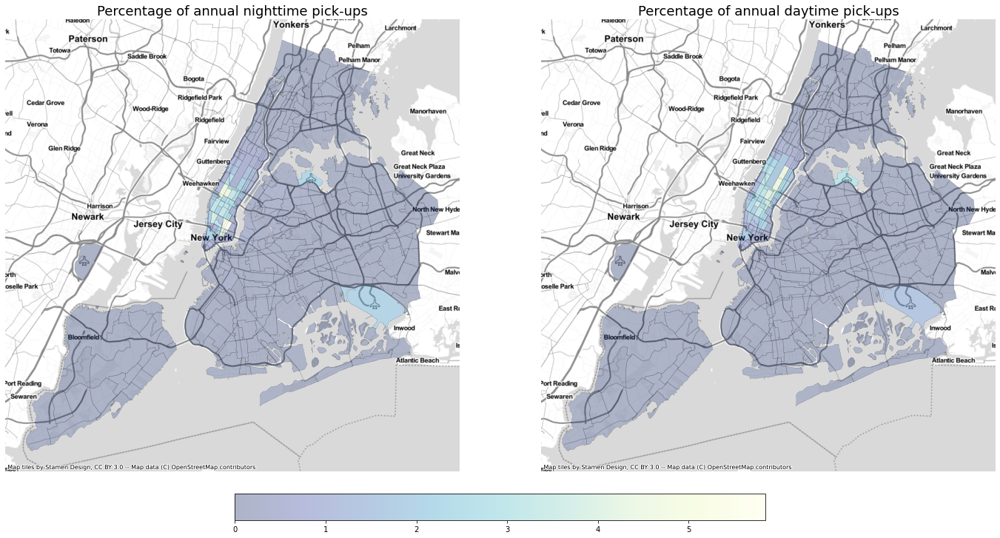

In [32]:
# Filter taxi trips by day time (night) and group them by pickup location
# Compute the number of trips
total_pickup_count_night = (
    train_df[train_df.pickup_hour_type == 0]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_night")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

# Filter taxi trips by day time (night) and group them by pickup location
# Compute the number of trips
total_pickup_count_day = (
    train_df[train_df.pickup_hour_type == 1]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_day")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

# Merge the pickup location (night) data with the zone data frame
zones_summary_df = pd.merge(
    zones_summary_df, total_pickup_count_night, how="left", on="LocationID"
)

# Merge the dropoff location (day) data with the zone data frame
zones_summary_df = pd.merge(
    zones_summary_df, total_pickup_count_day, how="left", on="LocationID"
)

# Fill NaN with zeros to avoid missing locations on the map
zones_summary_df.fillna(0, inplace=True)

# Convert pickup columns from counts to percentage of daily taxi trips
zones_summary_df[["pickup_all_night", "pickup_all_day"]] = zones_summary_df[
    ["pickup_all_night", "pickup_all_day"]
].transform(lambda x: np.divide(100 * x, x.sum()))

# Display heatmaps of the total number of trips by pickup and dropoff locations
plot_map(
    zones_summary_df,
    ["pickup_all_night", "pickup_all_day"],
    ["Percentage of annual nighttime pick-ups", "Percentage of annual daytime pick-ups"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Notes:** The above heat maps show the percentage of annual taxi trips by location, during the day and night. At night, pick-ups are primarily located around Hell's kitchen, east-village and lower-east side, which are known for their lively nightlife. During the day, most pickups are in and around Central Park, specifically in the Upper East Side - the business district.

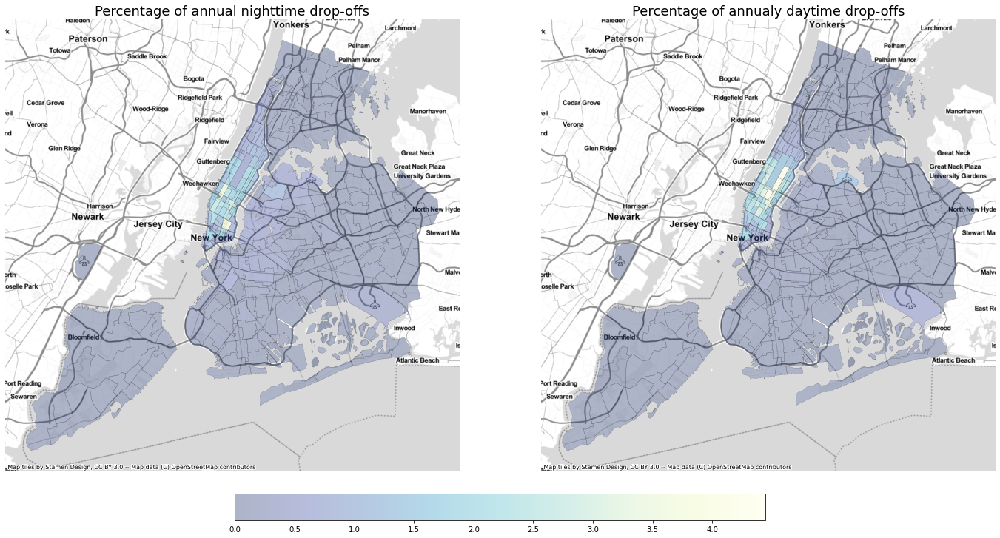

In [33]:
# Filter taxi trips by day time (night) and group them by dropoff location
# Compute the number of trips
total_dropoff_count_night = (
    train_df[train_df.pickup_hour_type == 0]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_night")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

# Filter taxi trips by day time (night) and group them by dropoff location
# Compute the number of trips
total_dropoff_count_day = (
    train_df[train_df.pickup_hour_type == 1]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_day")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

# Merge the dropoff location (night) data with the zone data frame
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_night, how="left", on="LocationID"
)

# Merge the dropoff location (day) data with the zone data frame
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_day, how="left", on="LocationID"
)

# Fill NaN with zeros to avoid missing locations on the map
zones_summary_df.fillna(0, inplace=True)

# Convert dropoff columns from counts to percentage of daily taxi trips
zones_summary_df[["dropoff_all_night", "dropoff_all_day"]] = zones_summary_df[
    ["dropoff_all_night", "dropoff_all_day"]
].transform(lambda x: np.divide(100 * x, x.sum()))

# Display heatmaps of the total number of trips by dropoff and dropoff locations
plot_map(
    zones_summary_df,
    ["dropoff_all_night", "dropoff_all_day"],
    ["Percentage of annual nighttime drop-offs", "Percentage of annualy daytime drop-offs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Notes:** The above heat maps show the percentage of annual taxi trips by location, during the day and night. Drop-offs show similar patterns to pick-ups. Southeast Manhattan is more busy at night, and central Manhattan during the day. In addition, suburban areas, including Queens, the Bronx, and Brooklyn, account for a large fraction of nighttime drop-offs. Below we will examine the change in the annual percentage of taxi rides in each borough and for each day of the week to answer our previous questions: do pick-up and drop-off locations change significantly over the week? Is the number of taxi trips directly link to trafic congestion/fluidity and trip duration?

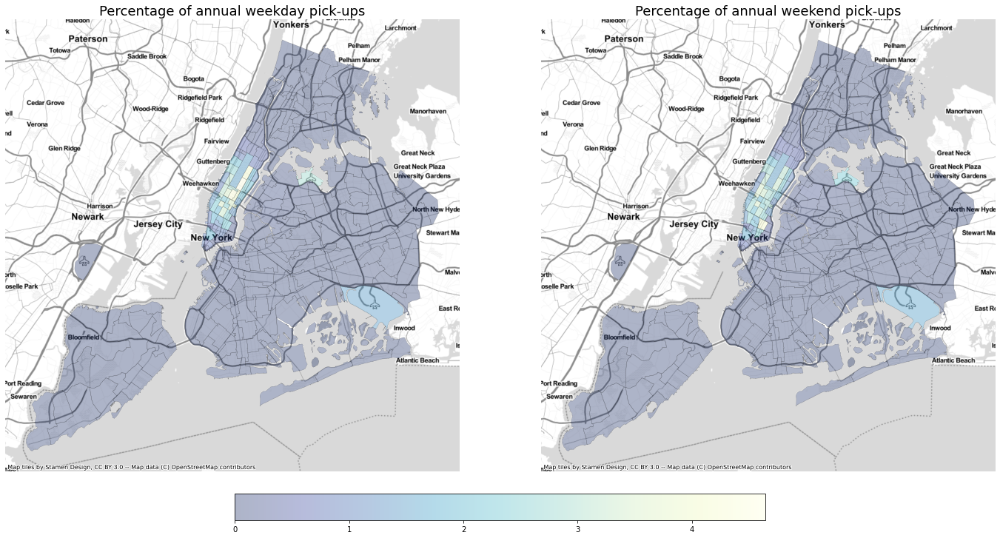

In [34]:
# Group taxi trips by pickup location and type of day
# Compute the number of trips
weekly_pickup_count = (
    train_df.groupby(["pickup_location_id", "pickup_weekday_type"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Add the pickup prefix to the weekdays and weekends
weekly_pickup_columns = ["pickup_" + w.lower().strip() for w in ["week", "weekend"]]

# Map numerical values to week days
weekly_pickup_count["pickup_weekday_type"] = weekly_pickup_count["pickup_weekday_type"].map(
  dict(zip([0,1], weekly_pickup_columns))
)

# Pivot the daily pickup data frame on the pickup weekday column
weekly_pickup_count = weekly_pickup_count.pivot(
    index="pickup_location_id", columns="pickup_weekday_type", values="count"
).reset_index()

# Rename the id column of the daily pickup data frame
weekly_pickup_count = weekly_pickup_count.rename(
    columns={"pickup_location_id": "LocationID"}
)

# Merge the daily pickup data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df, weekly_pickup_count, how="left", on="LocationID"
)

# Fill NaN with zeros to avoid missing locations on the map
zones_summary_df.fillna(0, inplace=True)

# Convert pickup columns from counts to percentage of daily taxi trips
zones_summary_df[weekly_pickup_columns] = zones_summary_df[
    weekly_pickup_columns
].transform(lambda x: np.divide(100 * x, x.sum()))

# Display heatmaps of the percentage of daily trips by pickup location
plot_map(
    zones_summary_df,
    ["pickup_week", "pickup_weekend"],
    ["Percentage of annual weekday pick-ups", "Percentage of annual weekend pick-ups"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Notes:** The heat maps above show the percentage of annual taxi trips by location and for weekdays and weekends. Midtown Manhattan is more heavily traveled during the week and the southeast and suburbs during the weekend. This result is consistent with previous observations.

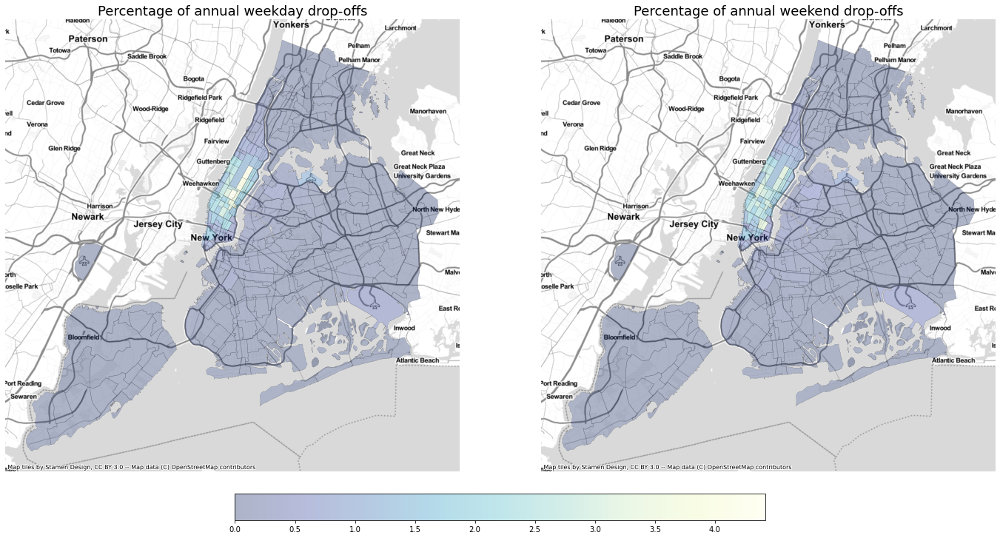

In [35]:
# Group taxi trips by dropoff location and type of day
# Compute the number of trips
weekly_dropoff_count = (
    train_df.groupby(["dropoff_location_id", "pickup_weekday_type"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Add the dropoff prefix to the weekdays and weekends
weekly_dropoff_columns = ["dropoff_" + w.lower().strip() for w in ["week", "weekend"]]

# Map numerical values to week days
weekly_dropoff_count["pickup_weekday_type"] = weekly_dropoff_count["pickup_weekday_type"].map(
  dict(zip([0,1], weekly_dropoff_columns))
)

# Pivot the daily dropoff data frame on the dropoff weekday column
weekly_dropoff_count = weekly_dropoff_count.pivot(
    index="dropoff_location_id", columns="pickup_weekday_type", values="count"
).reset_index()

# Rename the id column of the daily dropoff data frame
weekly_dropoff_count = weekly_dropoff_count.rename(
    columns={"dropoff_location_id": "LocationID"}
)

# Merge the daily dropoff data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df, weekly_dropoff_count, how="left", on="LocationID"
)

# Fill NaN with zeros to avoid missing locations on the map
zones_summary_df.fillna(0, inplace=True)

# Convert dropoff columns from counts to percentage of daily taxi trips
zones_summary_df[weekly_dropoff_columns] = zones_summary_df[
    weekly_dropoff_columns
].transform(lambda x: np.divide(100 * x, x.sum()))

# Display heatmaps of the percentage of daily trips by dropoff location
plot_map(
    zones_summary_df,
    ["dropoff_week", "dropoff_weekend"],
    ["Percentage of annual weekday drop-offs", "Percentage of annual weekend drop-offs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Notes:** The heat maps above show the percentage of annual taxi trips by location and for weekdays and weekends. Similarily to the previous observations, Midtown Manhattan is more heavily traveled during the week and the southeast and suburbs during the weekend. Therefore pick-up and drop-off locations do not change significantly during the week, but between weekdays and weekends. However, it is still difficult to tell whether the reduction in the number of taxi trips is linked to shorter travel time. Let's first analyze the distance, duration and speed for trips that take place in the same district.

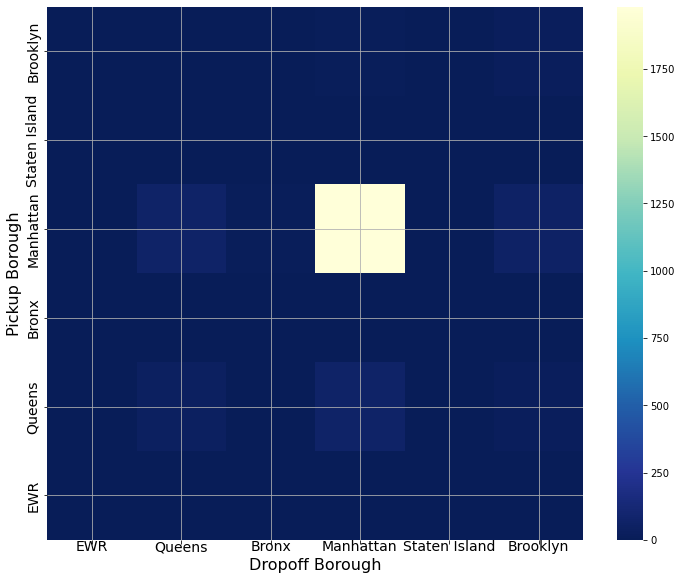

In [36]:
# Group taxi trips by pickup year-day, pickup borough, and dropff borough
# Compute the number of daily trip
pickup_count_borough = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "dropoff_borough_id"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Group taxi trips by pickup borough, and dropff borough
# Compute average number of daily trip
pickup_mean_borough = (
    pickup_count_borough.groupby(["pickup_borough_id", "dropoff_borough_id"])
    .agg(mean=("count", "mean"))
    .reset_index()
)

# Pivot the data frame on the droppoff borough column
pickup_count_borough_pvt = pickup_mean_borough.pivot(
    index="pickup_borough_id", columns="dropoff_borough_id", values="mean"
)

# Fill NaN with zeros to avoid missing locations on the map
pickup_count_borough_pvt.fillna(0, inplace=True)

# Display a heatmap of the average number of daily taxi trips 
plot_heatmap(
    pickup_count_borough_pvt,
    xticks=boroughs,
    yticks=boroughs,
    xlabel="Dropoff Borough",
    ylabel="Pickup Borough",
    figsize=(10, 8),
)

**Notes:** The heat map above shows the average number of daily taxi trips by origin and destination borough. The majority of the trips are within the same borough and most of them start and end in Manhattan. As noted above, another significant portion of trips start in Manhattan and end in Queens or Brooklyn. Below we will have a closer look at the amount of trips happening within the same or to another borough.

**Warnings:** The average number of taxi trips is computed on 0.8% of the whole dataset.

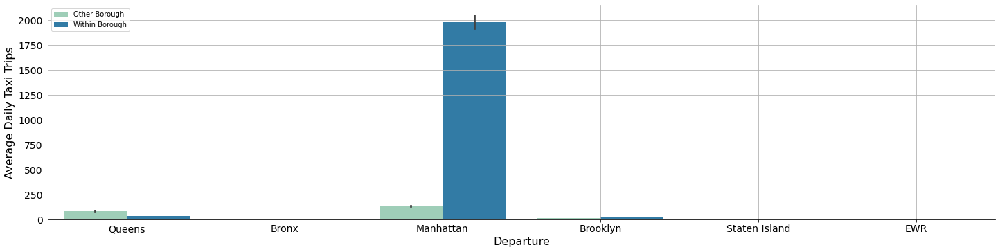

In [37]:
# Group taxi trips by pickup year-day, pickup borough, and within borough indicator
# Compute the number of daily trip
pickup_count_boro_twb = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "trip_within_borough"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_boro_twb["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_boro_twb["trip_within_borough"] = pickup_count_boro_twb[
    "trip_within_borough"
].map(
    dict(
        zip(
            np.arange(0, 2),
            ["Other Borough", "Within Borough"],
        )
    )
)

# Replace numerical values by the name of the categories
pickup_count_boro_twb["pickup_borough_id"] = pickup_count_boro_twb[
    "pickup_borough_id"
].map(
    dict(
        zip(
            np.arange(0, 7),
            boroughs,
        )
    )
)

# Display a bar plot of the average number of daily trips by borough
plot_barplot(
    pickup_count_boro_twb,
    x_var="pickup_borough_id",
    y_var="count",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Daily Taxi Trips",
)

**Notes:** The histogram above shows the average daily taxi trips by borough and within the same borough or to another borough. As noted above, most trips are within the same borough and specifically in Manhattan. 

**Warnings:** Taxi trips starting the Bronx, Staten Island, and EWR are very infrequent and later results will have to be interpreted with caution.

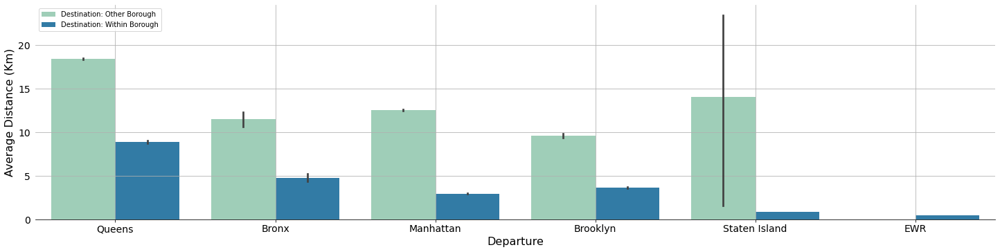

In [38]:
# Group taxi trips by pickup year-day, pickup borough, dropff borough, and within borough trip
# Compute the mean of trip distances and durations
pickup_avg_boro = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "trip_within_borough"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_boro["trip_speed"] = np.divide(
    pickup_avg_boro["trip_distance"], np.divide(pickup_avg_boro["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_boro["trip_within_borough"] = pickup_avg_boro["trip_within_borough"].map(
    dict(
        zip(
            np.arange(0, 2),
            ["Destination: Other Borough", "Destination: Within Borough"],
        )
    )
)

# Replace numerical values by the name of the categories
pickup_avg_boro["pickup_borough_id"] = pickup_avg_boro["pickup_borough_id"].map(
    dict(
        zip(
            np.arange(0, 7),
            boroughs,
        )
    )
)

# Display a bar plot of the average daily distance traveled by borough
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_distance",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Distance (Km)",
)

**Notes:** The barplot above shows the average daily distance travelled by borough and within the same borough or to another borough. The average distance traveled is significantly lower for trips within the same borough than to another borough. In addition, excluding Staten Island and EWR, the travel distance is the lowest for Manhattan.

**Warnings:** The average trip distance computed for the Bronx, Staten Island, and EWR should be interpreted with caution as yellow taxi trips starting in these boroughs are very infrequent.

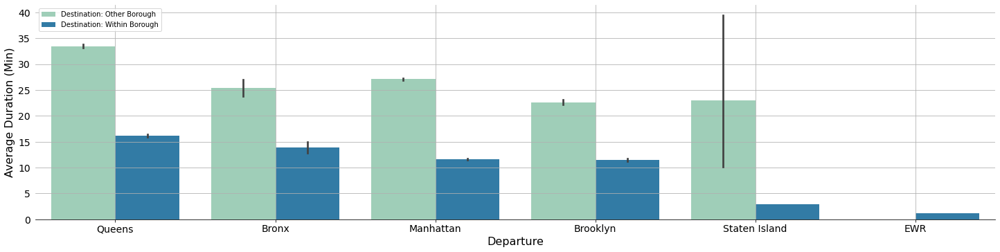

In [39]:
# Display a bar plot of the average daily travel time by borough
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_duration",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Duration (Min)",
)

**Notes:** The barplot above shows the average daily travel duration by borough and within the same borough or to another borough. The average travel duration is significantly lower for trips within the same borough than to another borough, which may be expected since the distance traveled is also lower. However, travel time in Manhattan is comparable to that of Brooklyn for trips within the same borough.

**Warnings:** The average trip duration computed for the Bronx, Staten Island, and EWR should be interpreted with caution as yellow taxi trips starting in these boroughs are very infrequent.

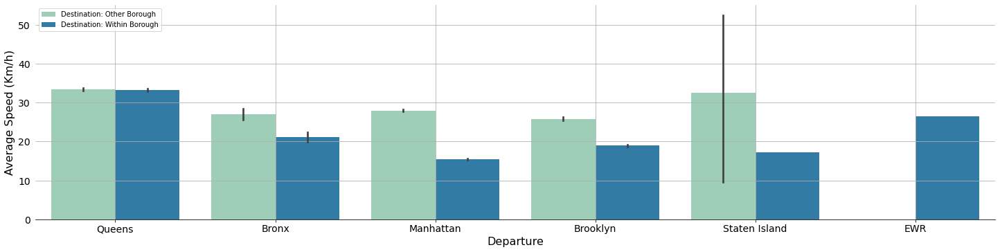

In [40]:
# Display a bar plot of the average daily travel speed by borough
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_speed",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Speed (Km/h)",
)

**Notes:** The barplot above shows the average daily travel speed by borough, within the same borough or to another borough. The difference in travel speed between trips within a borough and to another borough is not as significant as the difference in average travel distance and duration. Manhattan, with its high population density and numerous intersections, appears to be one of the boroughs most strongly affected by traffic density, since the travel speed within this borough is the lowest. Below we will take a look at the correlation between the number of daily taxi trips and the average trip duration.

**Warnings:** The average trip speed computed for the Bronx, Staten Island, and EWR should be interpreted with caution as yellow taxi trips starting in these boroughs are very infrequent.

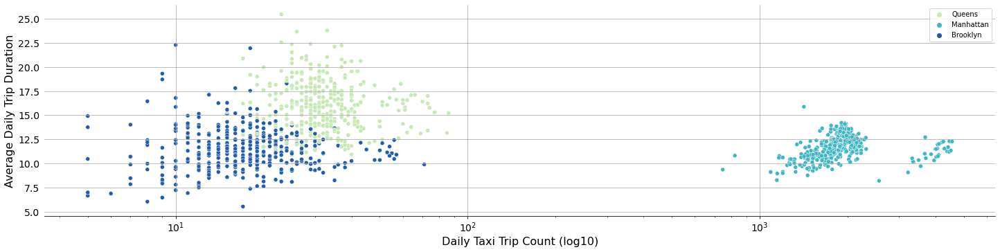

In [41]:
# Get a subset of the train data frame where trips are within the same borough and only Queens, Manhattan, and Brooklyn are selected
filtered_corr_df = train_df[
    (train_df.trip_within_borough == 1)
    & (train_df["pickup_borough_id"].isin([1, 3, 5]))
]

# Group taxi trips by pickup year-day, and pickup borough
# Compute the number of daily taxi trips
pickup_count_boro_corr = (
    filtered_corr_df.groupby(["pickup_yearday", "pickup_borough_id"])
    .size()
    .to_frame("trip_count")
    .reset_index()
)

# Group taxi trips by pickup year-day, and pickup borough
# Compute the mean of trip duration
pickup_avg_boro_corr = (
    filtered_corr_df.groupby(["pickup_yearday", "pickup_borough_id"])
    .agg({"trip_duration": np.mean})
    .reset_index()
)

# Merge the two data frames into a new one
pickup_boro_corr = pd.merge(pickup_count_boro_corr, pickup_avg_boro_corr, how="left")

# Replace numerical values by the name of the categories
pickup_boro_corr["pickup_borough_id"] = pickup_boro_corr["pickup_borough_id"].map(
    dict(
        zip(
            np.arange(0, 7),
            boroughs,
        )
    )
)

# Display a scatter plot of Daily taxi trip count vs the average daily trip duration
plot_scatterplot(
    pickup_boro_corr,
    x_var="trip_count",
    y_var="trip_duration",
    labels="pickup_borough_id",
    xlabel="Daily Taxi Trip Count (log10)",
    ylabel="Average Daily Trip Duration",
)

**Notes:** The scatter plot above shows the average daily trip length as a function of the number of daily taxi trips . Different patterns are observed for different borough. For Queens, there appears to be a negative correlation between the number of daily rides and their duration, while the correlation appears to be positive for Manhattan.

**Warnings:** data for the Bronx, Staten Island, and EWR were not included in this analysis as yellow taxi trips starting in these boroughs are very infrequent and may cause intepretation issues.

In [42]:
# Calculate Pearson correlation coefficient between the number of trips and trip duration for the three selected boroughs.
pickup_boro_corr["trip_count"].corr(pickup_boro_corr["trip_duration"])

-0.30078426876846687

**Notes:** If we consider New York state as a single entity, there is a strong negative correlation between the number of daily trips and their duration.

In [43]:
# Calculate Pearson correlation coefficient between the number of trips and trip duration for Manhattan
pickup_boro_corr.loc[
    pickup_boro_corr["pickup_borough_id"] == "Manhattan", "trip_count"
].corr(pickup_boro_corr["trip_duration"])

0.1084198000483713

**Notes:** There is a weak positive correlation between the number of daily trips and their duration for Manhattan. In this case, the number of daily trips could be used as an indicator of traffic density. However, let's bear in mind that numerous factors affect traffic density.

In [44]:
# Calculate Pearson correlation coefficient between the number of trips and trip duration for Queens
pickup_boro_corr.loc[
    pickup_boro_corr["pickup_borough_id"] == "Queens", "trip_count"
].corr(pickup_boro_corr["trip_duration"])

-0.11299458895225782

**Notes:** There is a low negative correlation between the number of daily trips and their duration for Queens. This weak negative correlation cannot be easily explained and further investigations should be conducted.

In [45]:
# Calculate Pearson correlation coefficient between the number of trips and trip duration for Brooklyn
pickup_boro_corr.loc[
    pickup_boro_corr["pickup_borough_id"] == "Brooklyn", "trip_count"
].corr(pickup_boro_corr["trip_duration"])

-0.03215666198058882

**Notes:** Finally, there is no correlation between the number of daily trips and their duration for Brooklyn. The impact of an increase or decrease in daily taxi trips on travel time is more complex than expected and should be studied separately for each borough. Below, we will take a closer look at tolls and their impact on travel distance, duration, and speed.

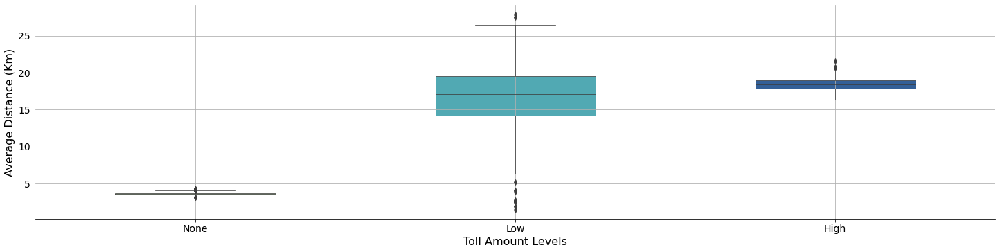

In [46]:
# Group taxi trips by pickup year-day and toll amounts
# Compute the mean of trip distances and durations
pickup_avg_toll = (
    train_df.groupby(["pickup_yearday", "toll"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_toll["trip_speed"] = np.divide(
    pickup_avg_toll["trip_distance"], np.divide(pickup_avg_toll["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_toll["toll"] = pickup_avg_toll["toll"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Display a barplot of toll amounts vs trip distance
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_distance",
    xlabel="Toll Amount Levels",
    ylabel="Average Distance (Km)",
)

**Notes:** The boxplots above show the average daily distance traveled as a function of the amount of toll paid. The average distance traveled is three to five time greater when the trip passes through a tollbooth. However, there is no snignificant difference between high and low toll prices. Tollbooths are typically located before bridges, tunnels and on highways in the New York metropolitan area. Paying at a tollbooth usually implies a longer distance to travel to the destination. These facilities are also a major cause of traffic congestion because cars must stop to pay at the booth. However, the booths have recently been replaced by a new [automated systems](https://www.localsyr.com/news/local-news/construction-to-remove-toll-booths-along-nys-thruway-resumes/).

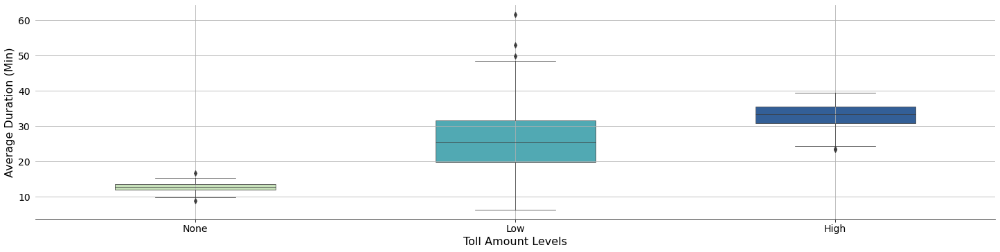

In [47]:
# Display a barplot of toll amounts vs trip duration
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_duration",
    xlabel="Toll Amount Levels",
    ylabel="Average Duration (Min)",
)

**Notes:** The boxplots above show the average daily travel time as a function of the amount of toll paid. The average travel time is two to three times higher when the trip passes through a toll booth. There is also a significant difference between high and low toll prices. The higher the price, the longer the travel time. As the price [varies](https://tollguru.com/toll-wiki/toll-rates-new-york-bridges-tunnels), different prices may give us an approximate origin and destination of the trip.

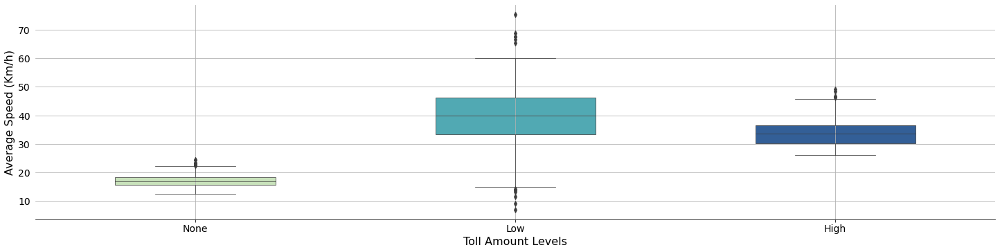

In [48]:
# Display a barplot of toll amounts vs trip speed
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_speed",
    xlabel="Toll Amount Levels",
    ylabel="Average Speed (Km/h)",
)

**Note:** The graphs above show the average daily travel speed as a function of the amount of toll paid. The average travel speed is also two to three times higher when the trip passes through a tollbooth. This could mean that most trips passing through a toll occur in low-density areas or are going from a high-density area to a low-density area and vice versa. Road infrastructure may also play an important role in this respect, as speed limit increases on highways. In addition, there is also a marginal difference between high and low toll prices. Trips with high toll prices have lower travel speeds than those with low toll prices. This could indicate that the cab passed through a high traffic density area or that traffic was slowed down at some point due to other circumstances.

## 2.2 External Dataset
## 2.2.1 Temporal Analysis of Weather Data 
### Goal:
Detect and describe patterns, trends, and relationships among temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify weather variables that may impact traffic flow, and thus trip duration, in and around New York City.
### Code:

### Weather Data: Average Temperature

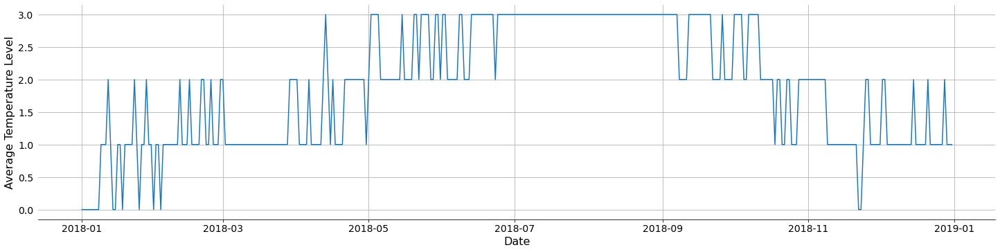

In [49]:
# Display a lineplot of average temperature vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="avg_temp",
    xlabel="Date",
    ylabel="Average Temperature Level",
)

**Notes:** The line graph above shows the average temperature as a function of date. The hottest days are observed in the summer, while average and low temperatures are observed in the shoulder seasons. The lowest temperatures, on the other hand, are observed only a few days or weeks per year, mainly in January and February. The impact of average temperature on the distance, time and speed of daily taxi trips will be examined below.

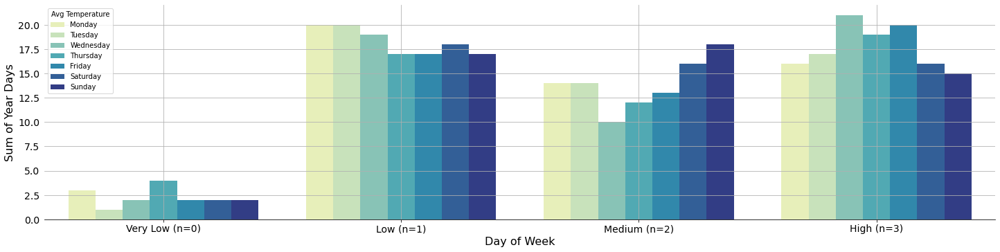

In [50]:
# Add a weekday column to the data frame
weather_df["weekday"] = weather_df["date"].dt.dayofweek

# Group the weather data by weekday and average temperature levels
# Compute the number days with specific average temperatures levels
weather_count_temp = (
    weather_df.groupby(["weekday", "avg_temp"]).size().to_frame("count").reset_index()
)

# Replace numerical values by the name of the categories
weather_count_temp["avg_temp"] = weather_count_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"]))
)

# Replace numerical values by the name of the categories
weather_count_temp["weekday"] = weather_count_temp["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all temperature levels
plot_barplot(
    weather_count_temp,
    x_var="avg_temp",
    y_var="count",
    labels="weekday",
    xlabel="Day of Week",
    ylabel="Sum of Year Days",
    legend="Avg Temperature",
)

**Note:** The bar plot above shows the sum of days in the year that fall into one of the average temperature category. Although much rarer than the low to high temperature days, days with very low temperature still  encompass all days of the week with more or less the same frequency. This is noteworthy since the number of taxi trips, their distance, duration, and speed are all highly dependent on the day of the week and hour of the day.

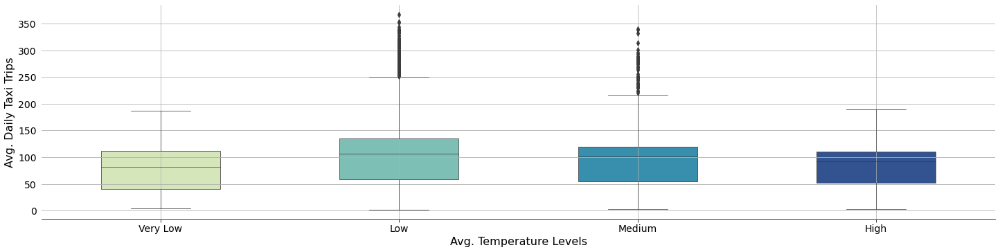

In [51]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature
# Compute the number of daily trip
pickup_count_temp = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "avg_temp"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_temp["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_temp["avg_temp"] = pickup_count_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_temp["pickup_weekday"] = pickup_count_temp["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a boxplot of average daily taxi trips vs average temperature levels
plot_boxplot(
    pickup_count_temp,
    x_var="avg_temp",
    y_var="count",
    xlabel="Avg. Temperature Levels",
    ylabel="Avg. Daily Taxi Trips",
)

**Notes:** The boxplot above show the average number of daily taxi trips for each average temperature level. The average number of daily rides is slightly lower for days with very low temperatures. This could suggest that the daily routines of New Yorkers change on  very cold days. It could also be an artifact, as these very cold days occur primarily in January and February.

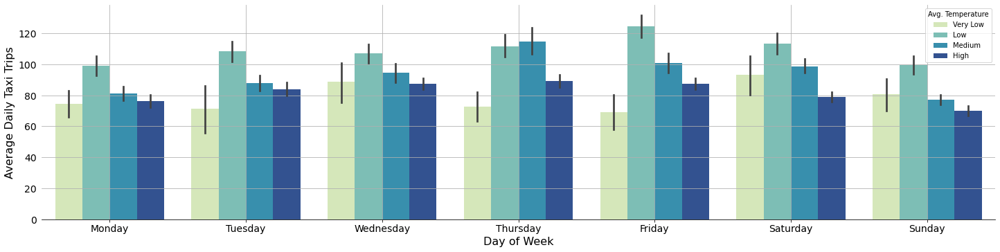

In [52]:
# Display a barplot of average daily taxi trips vs day of week for all average temperature levels
plot_barplot(
    pickup_count_temp,
    x_var="pickup_weekday",
    y_var="count",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature",
)

**Notes:** The barplot above shows the average number of daily taxi trips for each day of the week and each average temperature level. The average number of daily trips is slightly lower for very low and high temperatures on Thursdays and Fridays, but the exact cause is not clear.

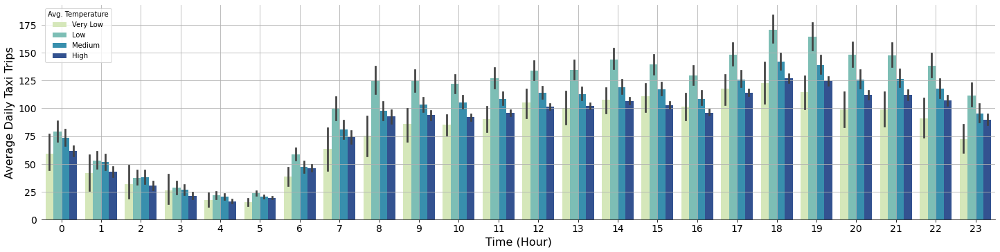

In [53]:
# Display a barplot of average daily taxi trips vs hour of day for all average temperature levels
plot_barplot(
    pickup_count_temp,
    x_var="pickup_hour",
    y_var="count",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature"
)

**Notes:** The barplot above shows the average number of daily taxi trips for each hour of the day and each average temperature level. The average number of daily trips is slightly lower for very low and high temperature during the peak hours. The exact cause is not clear, yet high temperatures may encourage the use of alternative means of transportation such as walking and cycling.

In [54]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature levels
# Compute the mean of trip distances and durations
pickup_avg_temp = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "avg_temp"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_temp["trip_speed"] = np.divide(
    pickup_avg_temp["trip_distance"], np.divide(pickup_avg_temp["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_temp["avg_temp"] = pickup_avg_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_temp["pickup_weekday"] = pickup_avg_temp["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_temp[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


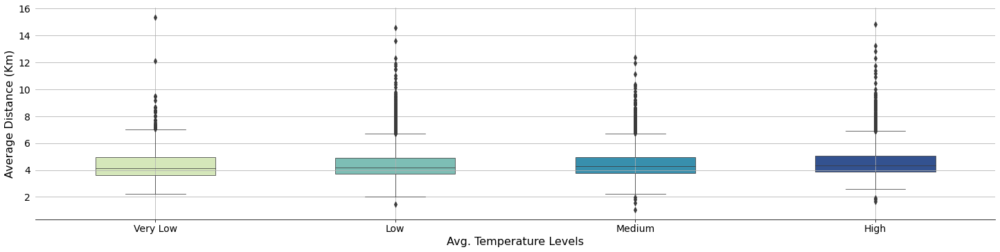

In [55]:
# Display a boxplot of average trip distance vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_distance",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Distance (Km)",
)

**Notes:** the boxplot above shows the average daily distance traveled for each average temperature level. No significant difference could be observed between these different levels.

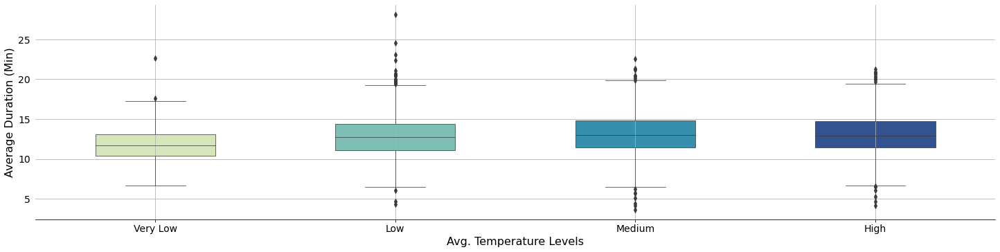

In [56]:
# Display a boxplot of average trip duration vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_duration",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Duration (Min)",
)

**Notes:** the boxplot above shows the average daily travel duration for each average temperature level. No significant difference could be observed between these different levels, yet the average travel duration appears to be marginally lower for very low temperatures.

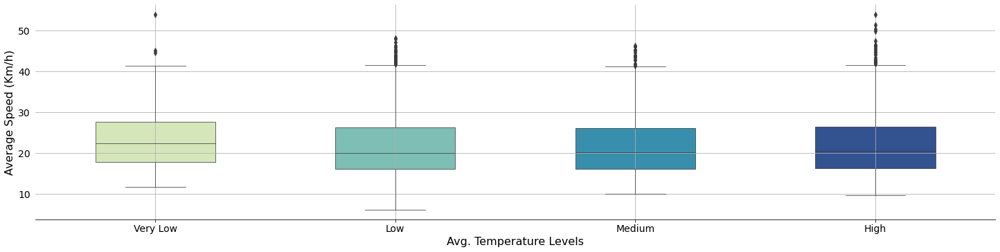

In [57]:
# Display a boxplot of average trip speed vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_speed",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Speed (Km/h)",
)

**Notes:** the boxplot above shows the average daily travel duration for each average temperature level. No significant difference could be observed between these different levels, yet the average travel speed appears to be marginally higher for very low temperatures.

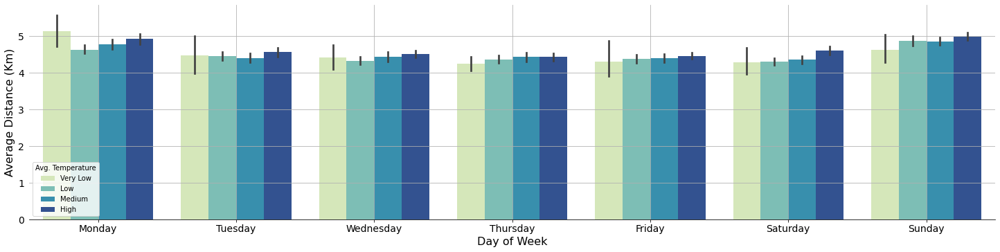

In [58]:
# Display a barplot of average trip distance vs day of week for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature",
)

**Notes:** the barplot above shows the average daily travel duration for each average temperature level. No major or minor difference could be observed between these different levels.

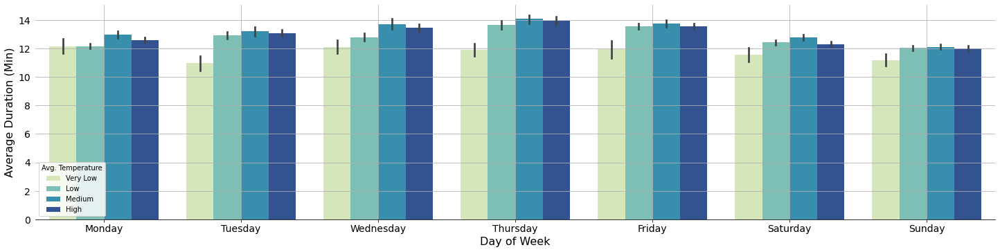

In [59]:
# Display a barplot of average trip duration vs hour of day for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature",
)

**Notes:** the barplot above shows the average daily travel duration for each day of the week and average temperature level. No significant difference could be observed between these different temperature levels, yet the average travel duration appears to be marginally lower for very low temperatures for each day of the week.

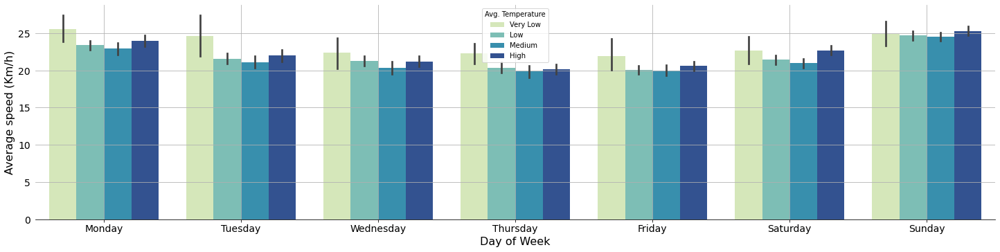

In [60]:
# Display a barplot of average trip duration vs hour of day for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature",
)

**Notes:** the barplot above shows the average daily travel duration for each day of the week and average temperature levels. No significant difference could be observed between these different temperature levels, yet the average travel duration appears to be marginally higher for very low temperatures for each day of the week.

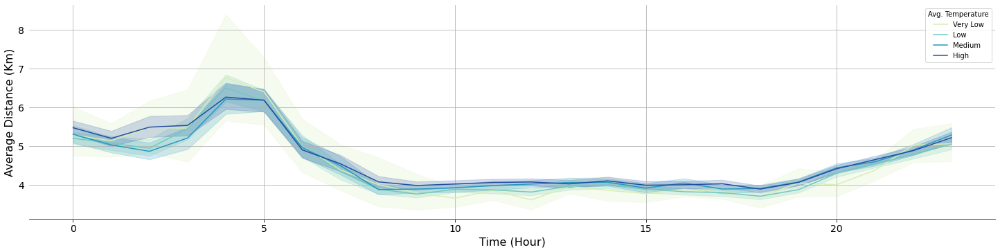

In [61]:
# Display a lineplot of average trip distance vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature",
)

**Notes:** the lineplot above shows the average daily distance traveled for each hour of the day and average temperature level. No major or minor difference could be observed between these different levels.

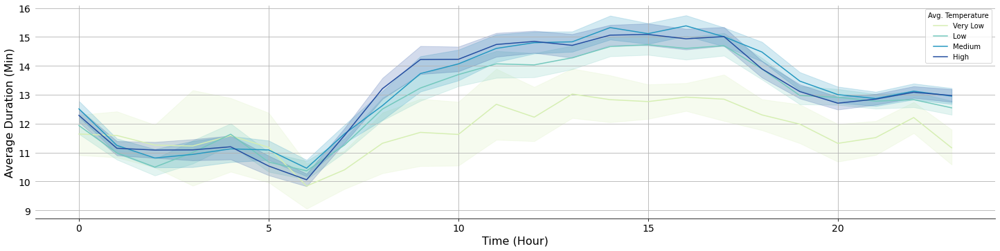

In [62]:
# Display a lineplot of average trip duration vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature",
)

**Notes:** The line plot above shows the average daily travel time for each hour of the day and each average temperature level. The average travel time is lower during peak hours for days with very low temperatures. Knowing that no difference was found in travel time between each level, this could indicate that traffic is more fluid on very cold days. The exact causes are probably multiple and complex. We also cannot completely rule out the possibility that this observation is an artifact, as these cold days occur mainly in January and February.

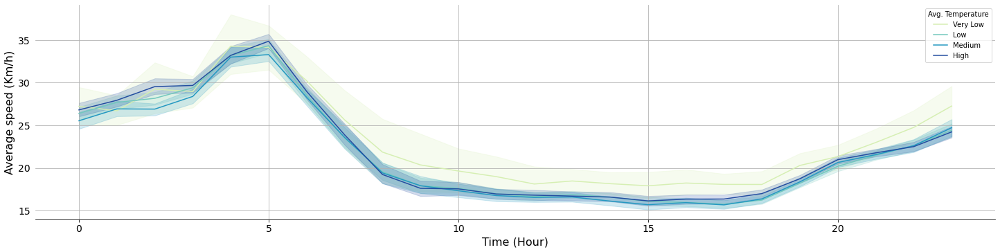

In [63]:
# Display a lineplot of average trip duration vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature",
)

**Notes:** the lineplot above shows the average daily travel speed for each hour of the day and average temperature levels. The average travel speed is marginally higher during peak hours for days with very low temperatures. As previously stated this could indicate that traffic is more fluid on very cold days, but the possibility that this observation is an artifact can also not be ruled out.

### Weather Data: Precipitations

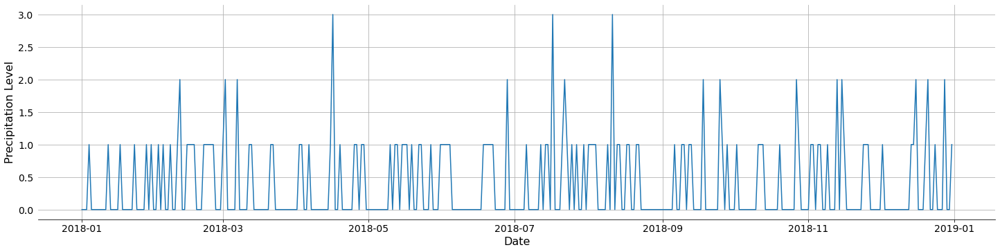

In [64]:
# Display a lineplot of precipitation vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="prec",

    xlabel="Date",
    ylabel="Precipitation Level",
)

**Notes:** The line plot above shows the daily precipitations levels as a function of the date. The lowest precipitation levels occur frequently throughout the year, while the highest precipitation levels occur only on a few occasions. The impact of average temperature on the distance, time and speed of daily taxi trips will be discussed below.

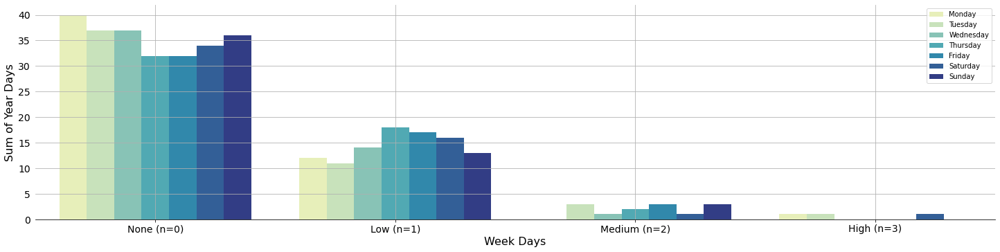

In [65]:
# Group the weather data by weekday and precipitation levels
# Compute the number days with specific precipitation levels
weather_count_prec = (
    weather_df.groupby(["weekday", "prec"]).size().to_frame("count").reset_index()
).sort_values(["prec", "weekday"])

# Replace numerical values by the name of the categories
weather_count_prec["prec"] = weather_count_prec["prec"].map(
    dict(
        zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"])
    )
)

# Replace numerical values by the name of the categories
weather_count_prec["weekday"] = weather_count_prec["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs sum of year days for all precipitation levels
plot_barplot(
    weather_count_prec,
    x_var="prec",
    y_var="count",
    labels="weekday",
    xlabel="Week Days",
    ylabel="Sum of Year Days",
)

**Note:** The bar plot above shows the sum of days in the year that fall into one of the daily precipitation cateogry. Although much less frequent than days with a low precipitation level, days with a medium precipiation level still encompass all days of the week with more or less the same frequency. However, days with a high precipitation level are rare and only emcompass a few week days. This is noteworthy since the number of taxi trips, their distance, duration, and speed are all highly dependent on the day of the week and hour of the day.

**Warnings:** The results obtained for a high level of precipitation should be interpreted with caution.

In [66]:
# Group taxi trips by pickup year-day, week-day, hour, and precipitation levels
# Compute the number of daily trip
pickup_count_prec = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "prec"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_prec["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_prec["prec"] = pickup_count_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_prec["pickup_weekday"] = pickup_count_prec["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_prec.head()

,pickup_yearday,pickup_weekday,pickup_hour,prec,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


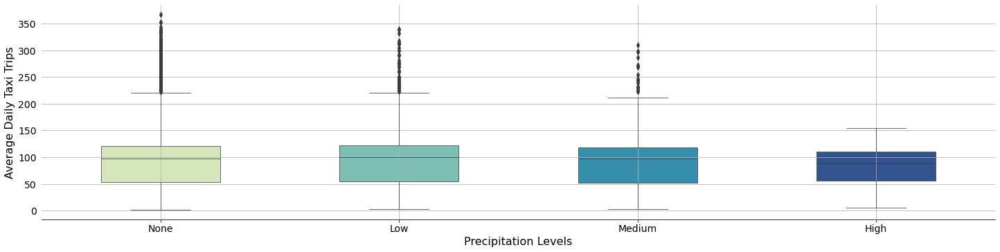

In [67]:
# Display a boxplot of average daily taxi trips vs precipitation levels
plot_boxplot(
    pickup_count_prec,
    x_var="prec",
    y_var="count",
    xlabel="Precipitation Levels",
    ylabel="Average Daily Taxi Trips",
)

**Notes:** The boxplot above show the average number of daily taxi trips for each precipitation level. The average number of daily rides is slightly lower for days with very low temperatures. This could suggest that the daily routines of New Yorkers change on  very cold days. It could also be an artifact, as these very cold days occur primarily in January and February.

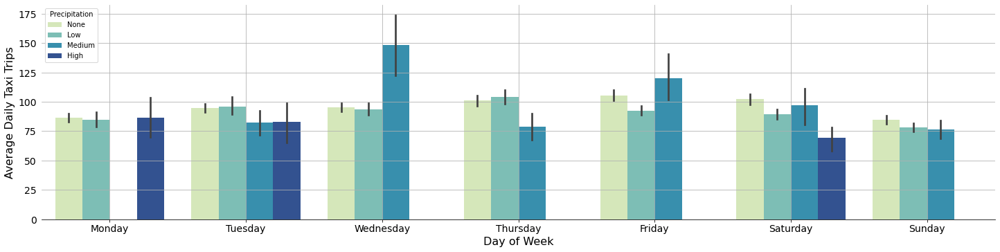

In [68]:
# Display a barplot of average daily taxi trips vs day of week for all precipitation levels
plot_barplot(
    pickup_count_prec,
    x_var="pickup_weekday",
    y_var="count",
    labels="prec",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Precipitation",
)

**Notes:** The barplot above shows the average number of daily taxi trips for each day of the week and each precipitation level. No clear difference can be observed between the different precipitation levels.

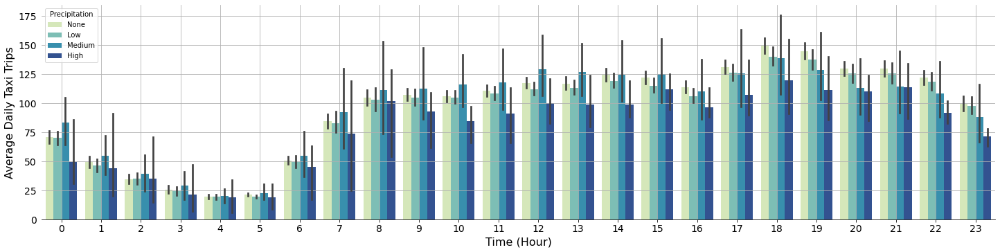

In [69]:
# Display a barplot of average daily taxi trips vs hour of day for all precipitation levels
plot_barplot(
    pickup_count_prec,
    x_var="pickup_hour",
    y_var="count",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Precipitation",
)

**Notes:** The barplot above shows the average number of daily taxi trips for each hour of the day and each precipitation level. No clear difference can be observed between the different precipitation levels.

In [70]:
# Group taxi trips by pickup year-day, week-day, hour, and precipitation levels
# Compute the mean of trip distances and durations
pickup_avg_prec = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "prec"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_prec["trip_speed"] = np.divide(
    pickup_avg_prec["trip_distance"], np.divide(pickup_avg_prec["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_prec["prec"] = pickup_avg_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_prec["pickup_weekday"] = pickup_avg_prec["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_prec[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


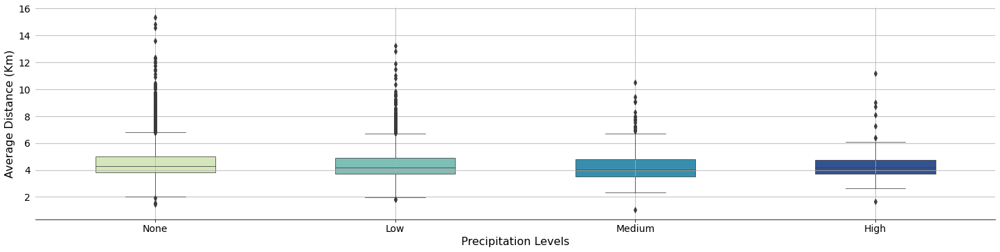

In [71]:
# Display a boxplot of average trip distance vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_distance",
    xlabel="Precipitation Levels",
    ylabel="Average Distance (Km)",
)

**Notes:** the boxplot above shows the average daily distance traveled for each precipitation level. No clear difference could be observed between these different levels.

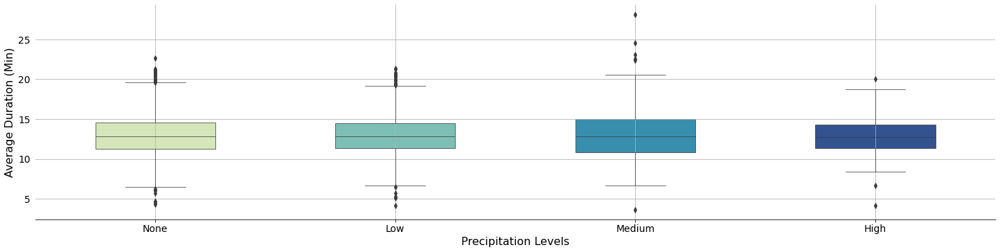

In [72]:
# Display a boxplot of average trip duration vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_duration",
    xlabel="Precipitation Levels",
    ylabel="Average Duration (Min)",
)

**Notes:** the boxplot above shows the average daily travel duration for each precipitation level. No clear difference could be observed between these different levels.

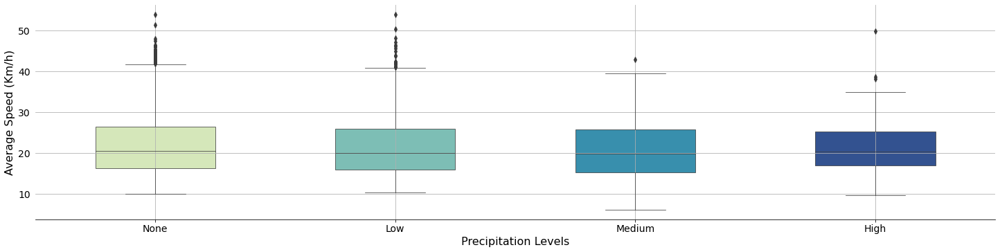

In [73]:
# Display a boxplot of average trip speed vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_speed",
    xlabel="Precipitation Levels",
    ylabel="Average Speed (Km/h)",
)

**Notes:** the boxplot above shows the average daily travel duration for each precipitation level. No clear difference could be observed between these different levels.

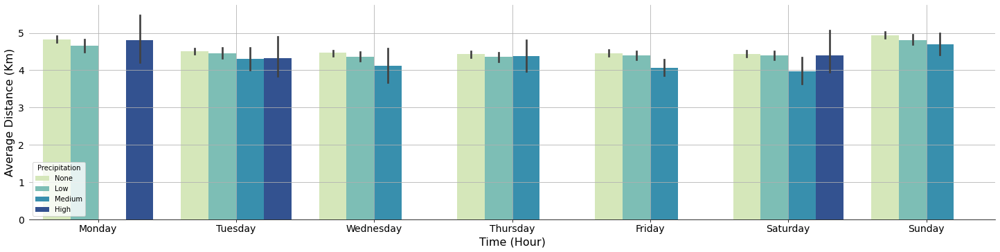

In [74]:
# Display a barplot of average trip distance vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Precipitation",
)

**Notes:** the barplot above shows the average daily distance travelled for each precipitation level. No clear difference could be observed between these different levels.

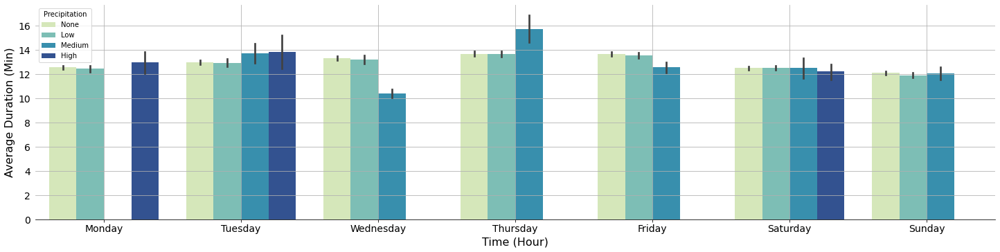

In [75]:
# Display a barplot of average trip duration vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Precipitation",
)

**Notes:** the barplot above shows the average daily travel duration for each day of the week and precipitation level. No clear difference could be observed between these different levels.

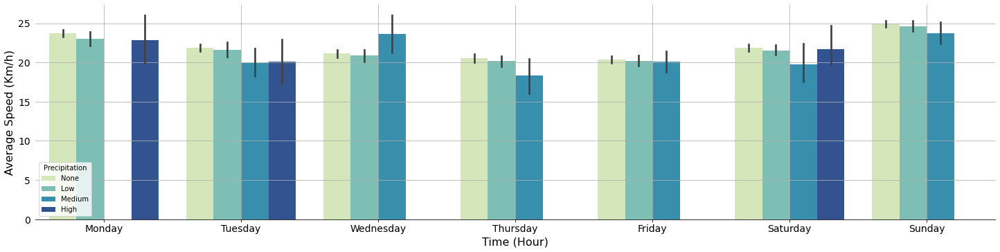

In [76]:
# Display a barplot of average trip speed vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Speed (Km/h)",
    legend="Precipitation",
)

**Notes:** the barplot above shows the average daily travel speed for each day of the week and precipitation level. No clear differences could be observed between these different levels.

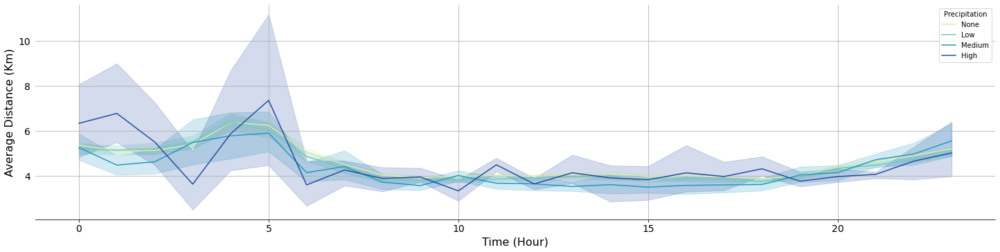

In [77]:
# Display a lineplot of average trip distance vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Precipitation",
)

**Notes:** the lineplot above shows the average daily distance traveled for each hour of the day and precipitation level. No clear differences could be observed between these different levels.

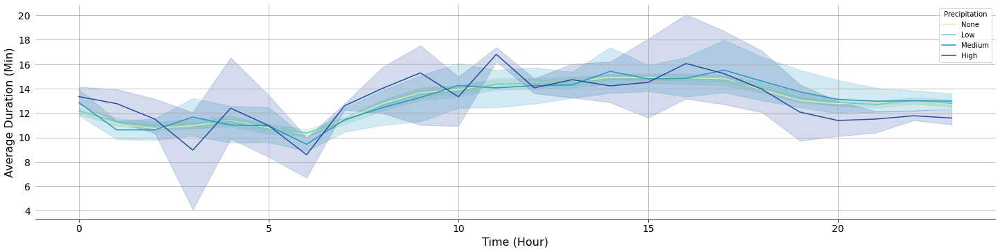

In [78]:
# Display a lineplot of average trip duration vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Precipitation",
)

**Notes:** the lineplot above shows the average daily travel duration for each hour of the day and precipitation level. No clear differences could be observed between these different levels.

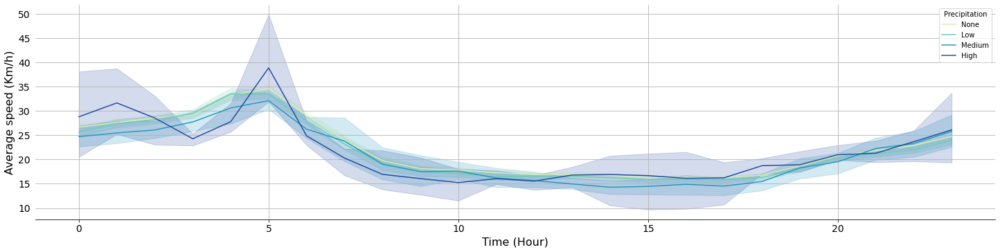

In [79]:
# Display a lineplot of average trip duration vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Precipitation",
)

**Notes:** the lineplot above shows the average daily travel speed for each hour of the day and precipitation level. No clear differences could be observed between these different levels.

## Weather Data: New Snowfall

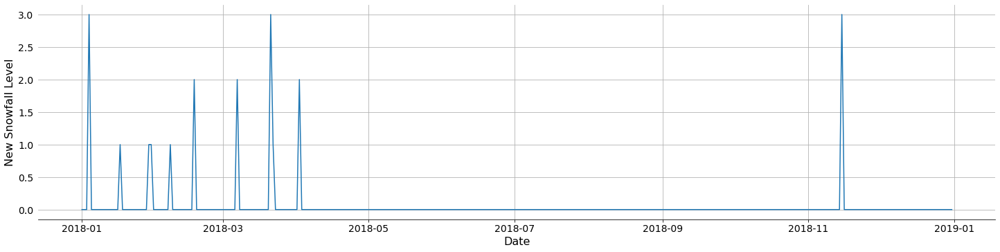

In [80]:
# Display a lineplot of new snowfall vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="new_snow",

    xlabel="Date",
    ylabel="New Snowfall Level",
)

**Notes:** The line plot above shows the daily new snowfall levels as a function of the date. Snowfalls only occur at few rare occasions during the coldest months of the year. However its impact on traffic congestion can be considerable as it might increase the amount of accident and lower travel speed. The impact of new snowfall on the distance, time and speed of daily taxi trips will be discussed below.

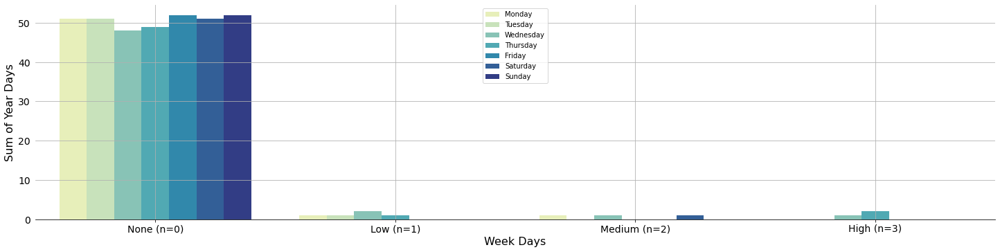

In [81]:
# Group the weather data by weekday and new snowfall levels
# Compute the number days with specific new snowfall levels
weather_count_nsnow = (
    weather_df.groupby(["weekday", "new_snow"]).size().to_frame("count").reset_index()
)

# Replace numerical values by the name of the categories
weather_count_nsnow["new_snow"] = weather_count_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"]))
)

# Replace numerical values by the name of the categories
weather_count_nsnow["weekday"] = weather_count_nsnow["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all new snowfall levels
plot_barplot(
    weather_count_nsnow,
    x_var="new_snow",
    y_var="count",
    labels="weekday",
    xlabel="Week Days",
    ylabel="Sum of Year Days",
)

**Note:** The bar plot above shows the sum of days in the year that fall into one of the daily precipitation cateogry. Days with snowfalls are rare and only emcompass a few week days. This is noteworthy since the number of taxi trips, their distance, duration, and speed are all highly dependent on the day of the week and hour of the day.

**Warnings:** The results obtained for a all levels of new snowfall should be interpreted with caution.

In [82]:
# Group taxi trips by pickup year-day, week-day, hour, and new snowfall levels
# Compute the number of daily trip
pickup_count_nsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "new_snow"])
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["new_snow", "pickup_weekday"])

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_nsnow["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_nsnow["new_snow"] = pickup_count_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_nsnow["pickup_weekday"] = pickup_count_nsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_nsnow.head()

,pickup_yearday,pickup_weekday,pickup_hour,new_snow,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


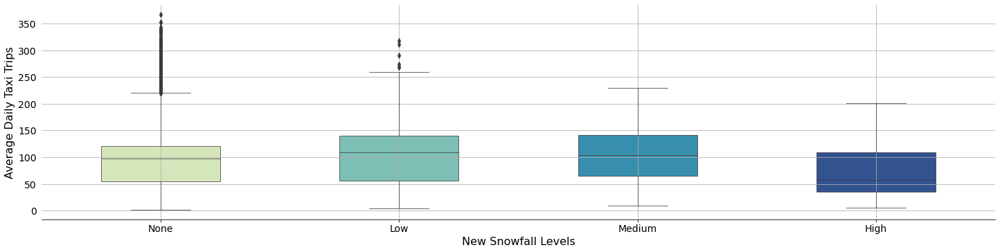

In [83]:
# Display a barplot of average daily taxi trips vs new snowfall levels
plot_boxplot(
    pickup_count_nsnow,
    x_var="new_snow",
    y_var="count",
    xlabel="New Snowfall Levels",
    ylabel="Average Daily Taxi Trips",
)

**Notes:** The boxplot above show the average number of daily taxi trips for each new snowfall level. The average number of daily rides is lower for days with high snowfalls.

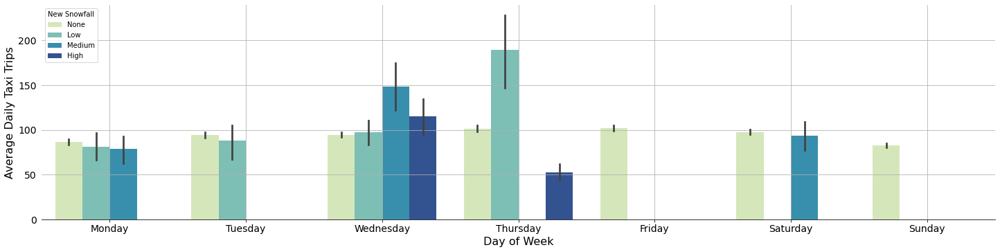

In [84]:
# Display a barplot of average daily taxi trips vs day of week for all new snowfall levels
plot_barplot(
    pickup_count_nsnow,
    x_var="pickup_weekday",
    y_var="count",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="New Snowfall",
)

**Notes:** The boxplot above shows the average number of daily taxi trips for each day of the week and each level of new snowfall. The average number of daily trips is significantly lower on Thursdays for the high new snowfall level. However, we saw earlier that New York was caught in a blizzard in early January and the city remained buried under a thick layer of snow for a few days after a heavy snowfall on Thursday, January 4, 2018. Two additional heavy snowfalls occurred on Wednesday, March 21 and Thursday, November 15, yet the one in March did not seem to affect traffic.

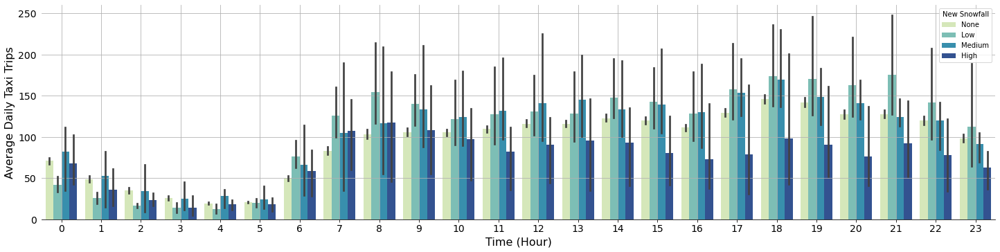

In [85]:
# Display a barplot of average daily taxi trips vs hour of day for new snowfall levels
plot_barplot(
    pickup_count_nsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="New Snowfall",
)

**Notes:** The bar plot above shows the average number of daily taxi trips for each hour of the day and each level of new snowfall. No clear difference can be seen between the different precipitation levels, as most new snowfall levels fall within their margins of error. However, the heaviest snowfall of 2018 may have affected traffic throughout the day and night.

In [86]:
# Group taxi trips by pickup year-day, week-day, hour, and new snowfall levels
# Compute the mean of trip distances and durations
pickup_avg_nsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "new_snow"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
).sort_values(["new_snow", "pickup_weekday"])

# Compute the average trip speed
pickup_avg_nsnow["trip_speed"] = np.divide(
    pickup_avg_nsnow["trip_distance"], np.divide(pickup_avg_nsnow["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_nsnow["new_snow"] = pickup_avg_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_nsnow["pickup_weekday"] = pickup_avg_nsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_nsnow[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


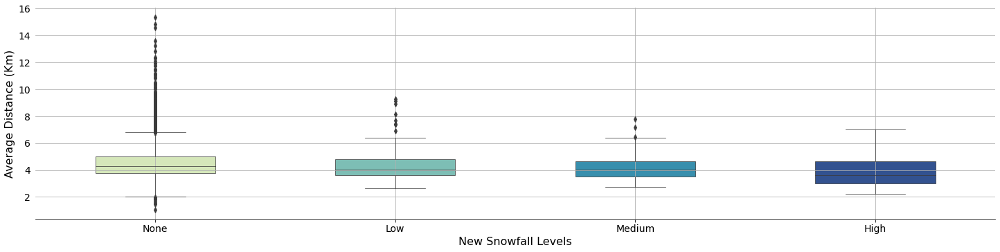

In [87]:
# Display a boxplot of average trip distance vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_distance",
    xlabel="New Snowfall Levels",
    ylabel="Average Distance (Km)",
)

**Notes:** the boxplot above shows the average daily distance traveled for each new snow level. No clear difference could be observed between these different levels.

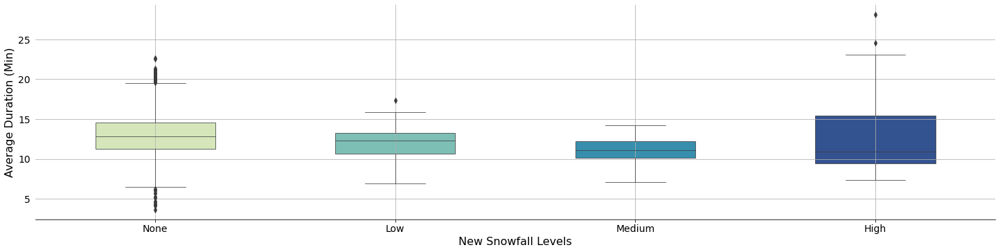

In [88]:
# Display a boxplot of average trip duration vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_duration",
    xlabel="New Snowfall Levels",
    ylabel="Average Duration (Min)",
)

**Notes:** the boxplot above shows the average daily travel duration for each new snowfall level. No clear difference could be observed between these different levels.

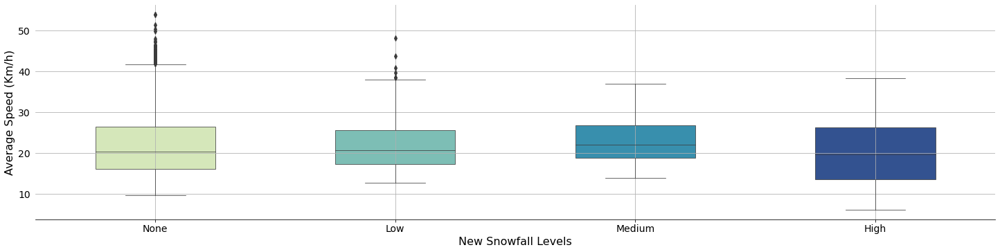

In [89]:
# Display a boxplot of average trip speed vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_speed",
    xlabel="New Snowfall Levels",
    ylabel="Average Speed (Km/h)",
)

**Notes:** the boxplot above shows the average daily travel speed for each new snowfall level. No clear difference could be observed between these different levels.

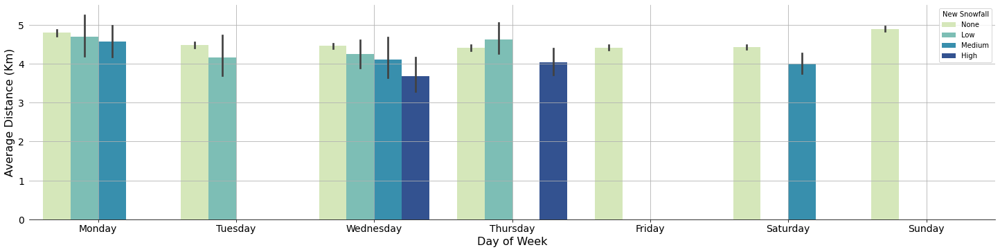

In [90]:
# Display a barplot of average trip distance vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Distance (Km)",
    legend="New Snowfall",
)

**Notes:** the barplot above shows the average daily distance travelled for each new snowfall level. No clear difference could be observed between these different levels.

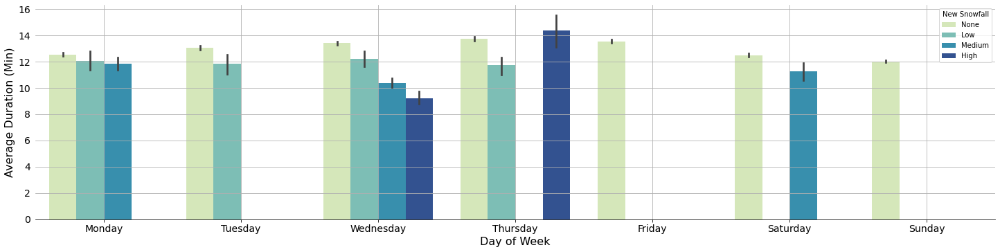

In [91]:
# Display a barplot of average trip duration vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Duration (Min)",
    legend="New Snowfall",
)

**Notes:** the barplot above shows the average daily travel duration for each day of the week and new snowfall level. No clear difference could be observed between these different levels.

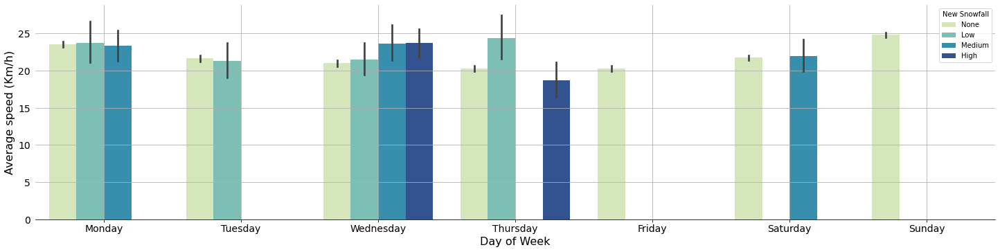

In [92]:
# Display a barplot of average trip duration vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average speed (Km/h)",
    legend="New Snowfall",
)

**Notes:** the barplot above shows the average daily travel speed for each day of the week and new snowfall level. No clear differences could be observed between these different levels.

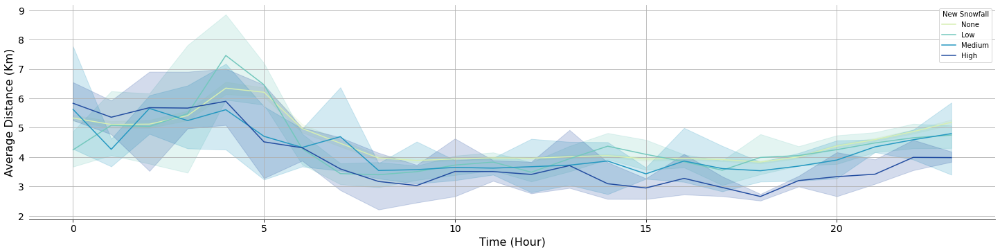

In [93]:
# Display a lineplot of average trip distance vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="New Snowfall",
)

**Notes:** the lineplot above shows the average daily distance traveled for each hour of the day and new snowfall level. No clear differences could be observed between these different levels

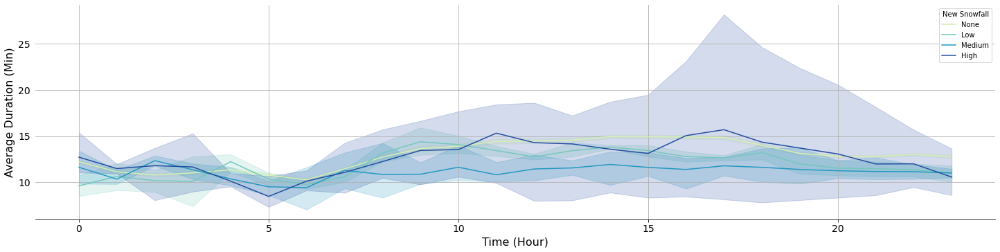

In [94]:
# Display a lineplot of average trip duration vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="New Snowfall",
)

**Notes:** the lineplot above shows the average daily travel duration for each hour of the day and new snowfall level. No clear difference could be observed between these different levels, but it appears that heavy snowfall resulted in an increase in travel time between 15:00 and 22:00.

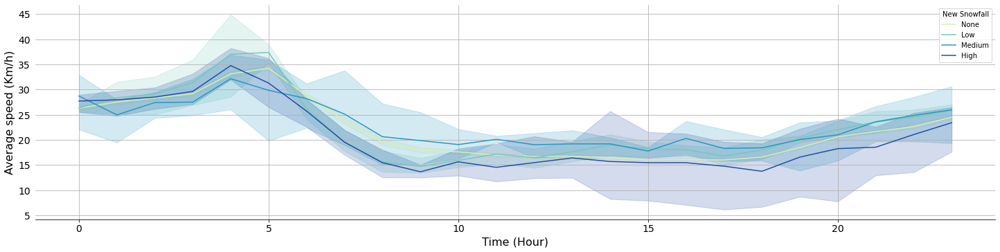

In [95]:
# Display a lineplot of average trip speed vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="New Snowfall",
)

**Notes:** the lineplot above shows the average daily travel speed for each hour of the day and new snowfall level. No clear difference could be observed between these different levels,

## Weather Data: Snow Depth

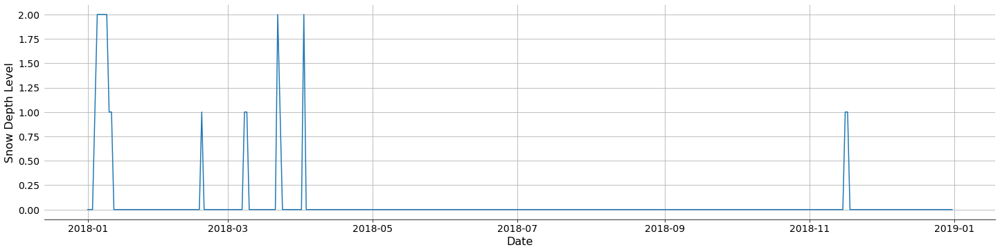

In [96]:
# Display a lineplot of snow depth vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="snow_depth",

    xlabel="Date",
    ylabel="Snow Depth Level",
)

**Notes:** The line plot above shows the daily snow depth levels as a function of the date. Snowfalls only occur at few rare occasions during the coldest months of the year and snow usually rapidely melts within a few days. However its impact on traffic congestion can be considerable as it might increase the amount of accident and lower travel speed. The impact of snow depth on the distance, time and speed of daily taxi trips will be discussed below.

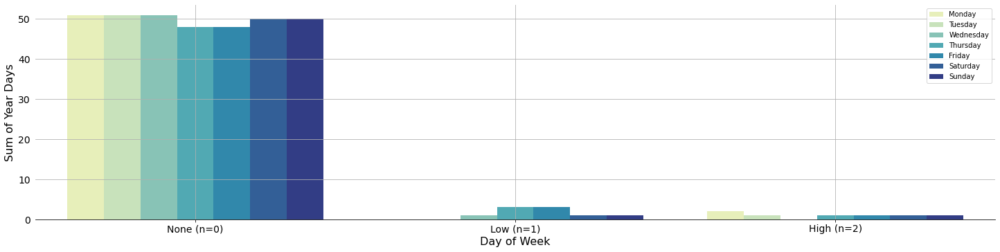

In [97]:
# Group the weather data by weekday and snow depth levels
# Compute the number days with specific snow depth levels
weather_count_temp = (
    weather_df.groupby(["weekday", "snow_depth"]).size().to_frame("count").reset_index()
).sort_values(["snow_depth", "weekday"])

# Replace numerical values by the name of the categories
weather_count_temp["snow_depth"] = weather_count_temp["snow_depth"].map(
    dict(zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "High (n=2)"]))
)

# Replace numerical values by the name of the categories
weather_count_temp["weekday"] = weather_count_temp["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all snow depth levels
plot_barplot(
    weather_count_temp,
    x_var="snow_depth",
    y_var="count",
    labels="weekday",
    xlabel="Day of Week",
    ylabel="Sum of Year Days",
)

**Note:** The bar plot above shows the sum of days in the year that fall into one of the daily snow depth categories. As noted earlier, days with snowfall are rare, but snow generally remains for a few days on roads and other infrastructure. Both levels of snow depth cover most weekdays, but with very little frequency.

**Warnings:** The results obtained for a all levels of snow depth should be interpreted with caution due to their low frequency.

In [98]:
# Group taxi trips by pickup year-day, week-day, hour, and snow depth levels
# Compute the number of daily trip
pickup_count_dsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "snow_depth"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_dsnow["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_dsnow["snow_depth"] = pickup_count_dsnow["snow_depth"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_dsnow["pickup_weekday"] = pickup_count_dsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_dsnow.head()

,pickup_yearday,pickup_weekday,pickup_hour,snow_depth,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


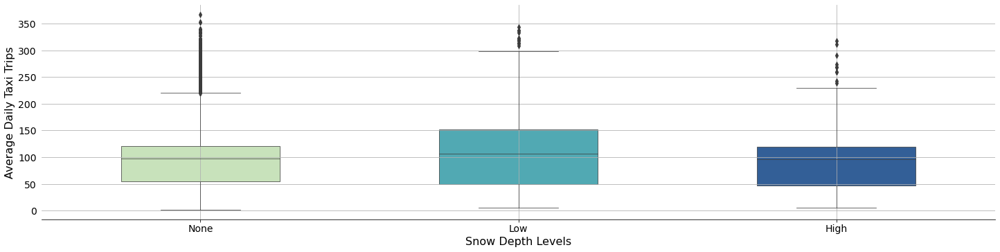

In [99]:
# Display a barplot of average daily taxi trips vs snow depth levels
plot_boxplot(
    pickup_count_dsnow,
    x_var="snow_depth",
    y_var="count",
    xlabel="Snow Depth Levels",
    ylabel="Average Daily Taxi Trips",
)

**Notes:** The barplot above shows the average number of daily taxi trips for each snow depth level. No clear difference can be observed between the different snow depth levels.

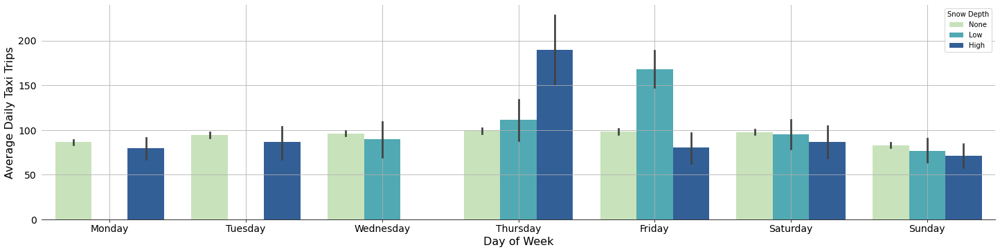

In [100]:
# Display a barplot of average daily taxi trips vs day of week for all snow depth levels
plot_barplot(
    pickup_count_dsnow,
    x_var="pickup_weekday",
    y_var="count",
    labels="snow_depth",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Snow Depth"
)

**Notes:** The barplot above shows the average number of daily taxi trips for each day of the week and each snow depth level. No clear difference can be observed between the different snow depth levels, yet the high snow depth level is higher on thursday. New Yorkers may have used taxi more frequently during heavy snow storm.

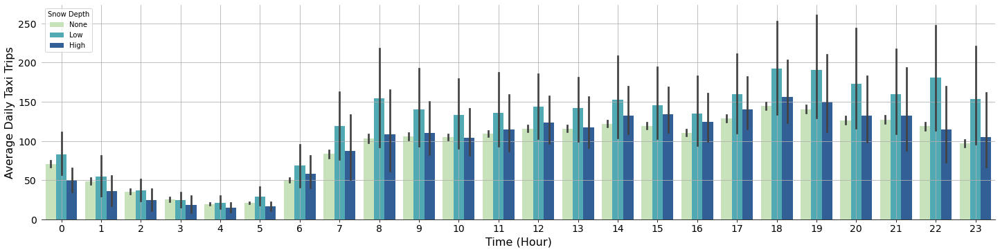

In [101]:
# Display a barplot of average daily taxi trips vs hour of day for all snow depth levels
plot_barplot(
    pickup_count_dsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Snow Depth"
)

**Notes:** The barplot above shows the average number of daily taxi trips for each hour of the day and each snow depth level. No clear difference can be observed between the different precipitation levels.

In [102]:
# Group taxi trips by pickup year-day, week-day, hour, and snow depth levels
# Compute the mean of trip distances and durations
pickup_avg_dsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "snow_depth"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_dsnow["trip_speed"] = np.divide(
    pickup_avg_dsnow["trip_distance"], np.divide(pickup_avg_dsnow["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_dsnow["snow_depth"] = pickup_avg_dsnow["snow_depth"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_dsnow["pickup_weekday"] = pickup_avg_dsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_dsnow[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


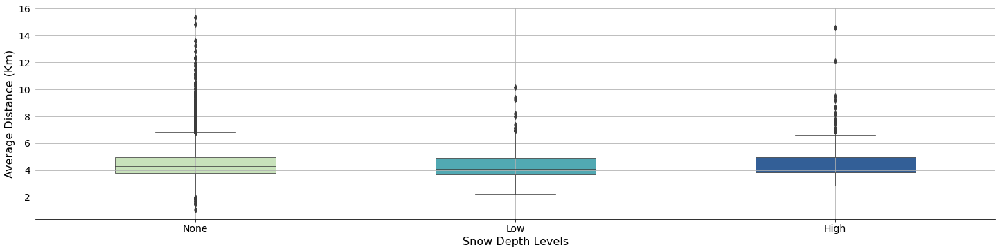

In [103]:
# Display a boxplot of average trip distance vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_distance",
    xlabel="Snow Depth Levels",
    ylabel="Average Distance (Km)",
)

**Notes:** the boxplot above shows the average daily distance traveled for each snow depth level. No clear difference could be observed between these different levels.

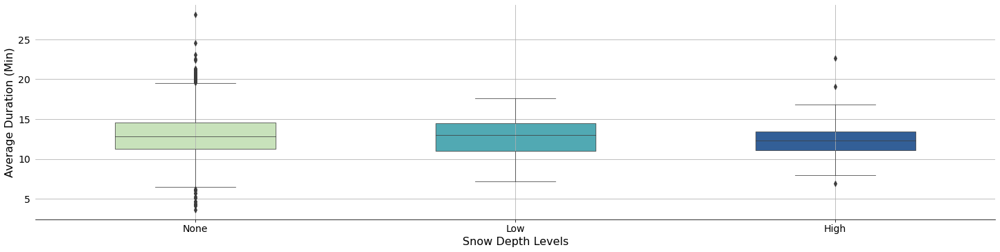

In [104]:
# Display a boxplot of average trip duration vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_duration",
    xlabel="Snow Depth Levels",
    ylabel="Average Duration (Min)",
)

**Notes:** the boxplot above shows the average daily travel duration for each snow depth level. No clear difference could be observed between these different levels.

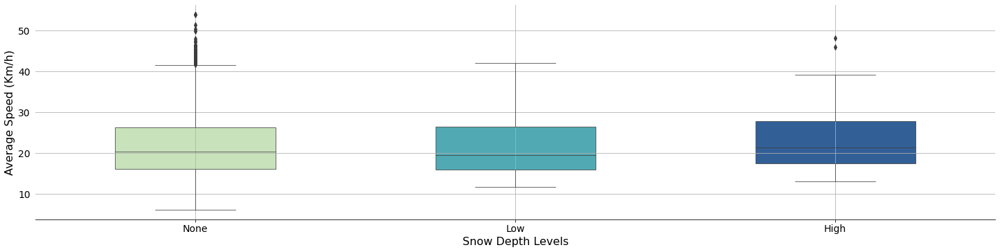

In [105]:
# Display a boxplot of average trip speed vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_speed",
    xlabel="Snow Depth Levels",
    ylabel="Average Speed (Km/h)",
)

**Notes:** the boxplot above shows the average daily travel speed for each snow depth level. No clear difference could be observed between these different levels.

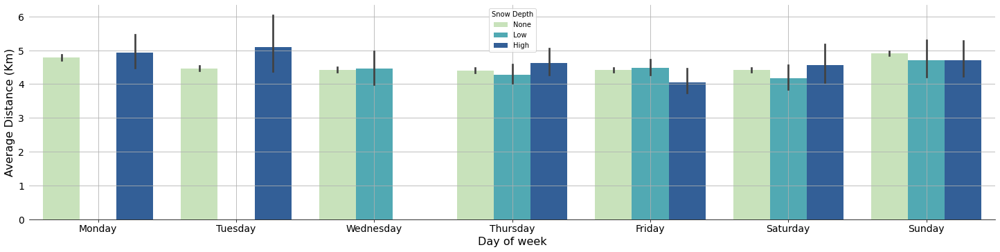

In [106]:
# Display a barplot of average trip distance vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Distance (Km)",
    legend="Snow Depth",
)

**Notes:** the barplot above shows the average daily distance travelled for each day of the week and each snow depth level. No clear difference could be observed between these different levels.

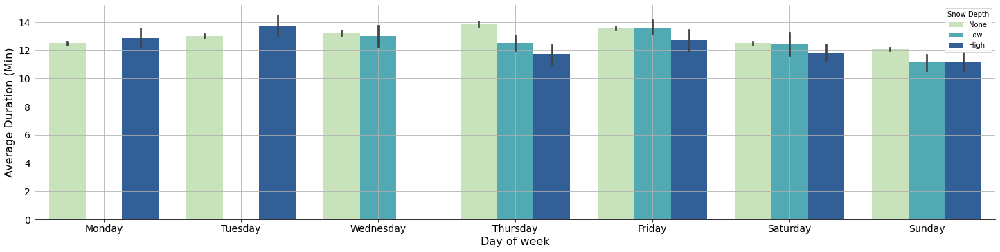

In [107]:
# Display a barplot of average trip duration vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Duration (Min)",
    legend="Snow Depth",
)

**Notes:** the barplot above shows the average daily travel duration for each day of the week and each snow depth level. No clear difference could be observed between these different levels.

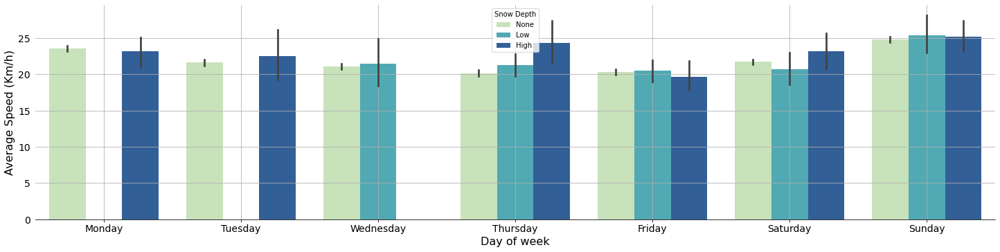

In [108]:
# Display a barplot of average trip speed vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Speed (Km/h)",
    legend="Snow Depth",
)

**Notes:** the barplot above shows the average daily travel speed for each day of the week and each snow depth level. No clear difference could be observed between these different levels.

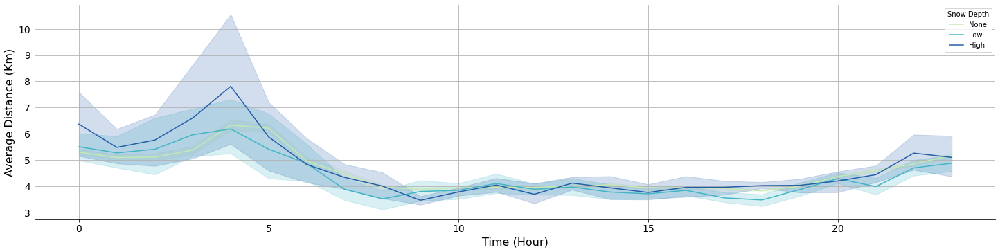

In [109]:
# Display a lineplot of average trip distance vs hour of day for all snow depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Snow Depth",
)

**Notes:** the lineplot above shows the average daily distance traveled for each hour of the day and snow depth level. No clear differences could be observed between these different levels.

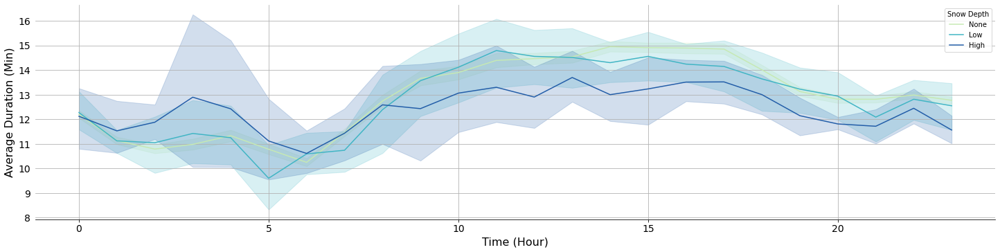

In [110]:
# Display a lineplot of average trip duration vs hour of day for all snow depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Snow Depth",
)

**Notes:** the lineplot above shows the average daily travel duration for each hour of the day and snow depth level. No clear differences could be observed between these different levels.

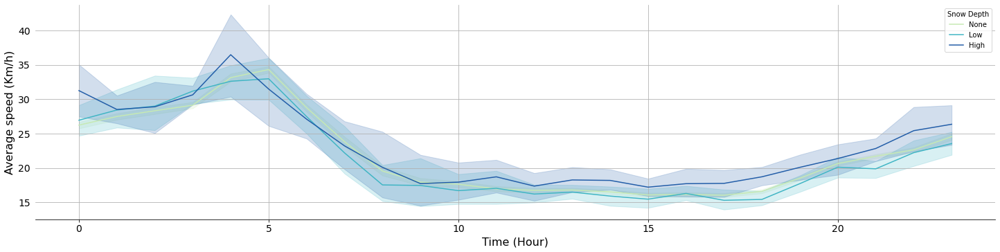

In [111]:
# Display a lineplot of average trip duration vs hour of day for all now depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Snow Depth",
)

**Notes:** the lineplot above shows the average daily travel speedfor each hour of the day and snow depth level. No clear differences could be observed between these different levels.

## 2.2.1 Temporal Analysis of Holidays Data 
### Goal:
Detect and describe patterns, trends, and relationships among temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify holidays and celebrations that may impact traffic flow, and thus trip duration, in and around New York City.
### Code:

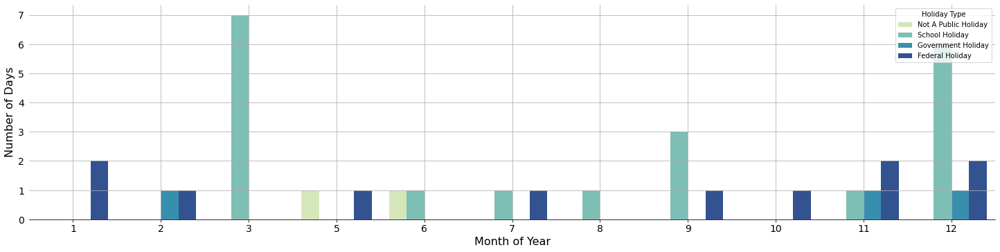

In [112]:
# Add a month column to the weather data frame
holidays_df["holiday_month"] = holidays_df["holiday_date"].dt.month

# Add a month column to the weather data frame
holidays_df["holiday_weekday"] = holidays_df["holiday_date"].dt.dayofweek

# Group the holidays data by wholiday date and type
# Compute the number days with specific average temperatures levels
holidays_count_viz = (
    holidays_df.groupby(["holiday_month", "holiday_type"])
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["holiday_type", "holiday_month"])


# Replace numerical values by the name of the categories
holidays_count_viz["holiday_type"] = holidays_count_viz["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            [
                "Not A Public Holiday",
                "School Holiday",
                "Government Holiday",
                "Federal Holiday",
            ],
        )
    )
)

# Display a barplot of the monthly holidays
plot_barplot(
    holidays_count_viz,
    x_var="holiday_month",
    y_var="count",
    labels="holiday_type",
    xlabel="Month of Year",
    ylabel="Number of Days",
    legend="Holiday Type",
)

**Note:** the bar plot above shows the number of holidays per month for each holiday category. School vacations are the most common type of vacation during the year, followed by federal and government vacations.

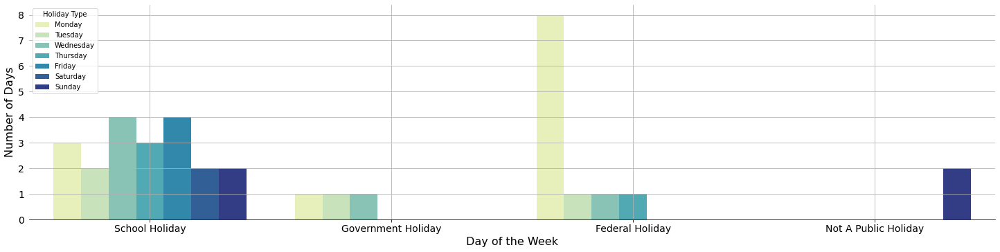

In [113]:
# Group the holidays data by wholiday date and type
# Compute the number days with specific average temperatures levels
holidays_count_viz = (
    holidays_df.groupby(["holiday_weekday", "holiday_type"])
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["holiday_weekday", "holiday_type"])


# Replace numerical values by the name of the categories
holidays_count_viz["holiday_type"] = holidays_count_viz["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            [
                "Not A Public Holiday",
                "School Holiday",
                "Government Holiday",
                "Federal Holiday",
            ],
        )
    )
)

# Replace numerical values by the name of the categories
holidays_count_viz["holiday_weekday"] = holidays_count_viz["holiday_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of the monthly holidays
plot_barplot(
    holidays_count_viz,
    x_var="holiday_type",
    y_var="count",
    labels="holiday_weekday",
    xlabel="Day of the Week",
    ylabel="Number of Days",
    legend="Holiday Type",
)

**Note:** The bar plot above shows the sum of days in the year that fall into one of the holidays cateogry. School holidays may be every day of the week, while government and federal holidays are mostly on weekdays. The two holidays which are not considered as public holidays but more as celebrations occur on sunday. This is noteworthy since the number of taxi trips, their distance, duration, and speed are all highly dependent on the day of the week and hour of the day.

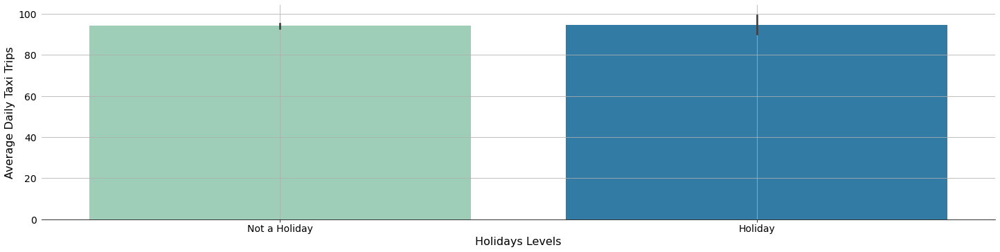

In [114]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature
# Compute the number of daily trip
pickup_count_holidays = (
    train_df.groupby(
        ["pickup_yearday", "pickup_weekday", "pickup_hour", "holiday", "holiday_type"]
    )
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["holiday_type", "pickup_weekday"])

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_holidays["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_holidays["holiday"] = pickup_count_holidays["holiday"].map(
    {0: "Not a Holiday", 1: "Holiday"}
)

# Replace numerical values by the name of the categories
pickup_count_holidays["holiday_type"] = pickup_count_holidays["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            holidays_type,
        )
    )
)

# Replace numerical values by the name of the categories
pickup_count_holidays["pickup_weekday"] = pickup_count_holidays["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of average daily taxi trip vs holidays 
plot_barplot(
    pickup_count_holidays,
    x_var="holiday",
    y_var="count",
    xlabel="Holidays Levels",
    ylabel="Average Daily Taxi Trips",
)

**Note:** the barplot above shows the average number of daily taxi trips for vacation and regular days.  Overall, there is no difference in the number of cab rides between vacation days and normal days. However, we have seen above that this is not entirely accurate, as during the spring break the number of trips increases substantially, while fewer trips were observed for several other holidays, such as Christmas Eve. 

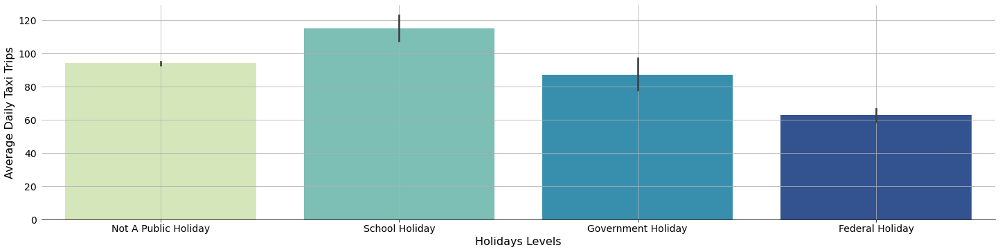

In [115]:
# Display a barplot of average daily taxi trips vs holidays categeogies
plot_barplot(
    pickup_count_holidays,
    x_var="holiday_type",
    y_var="count",
    xlabel="Holidays Levels",
    ylabel="Average Daily Taxi Trips",
)

**Note:** the bar plot above shows the average number of daily taxi trips for each holidays category. The average number of cab trips is marginally lower for federal holidays.

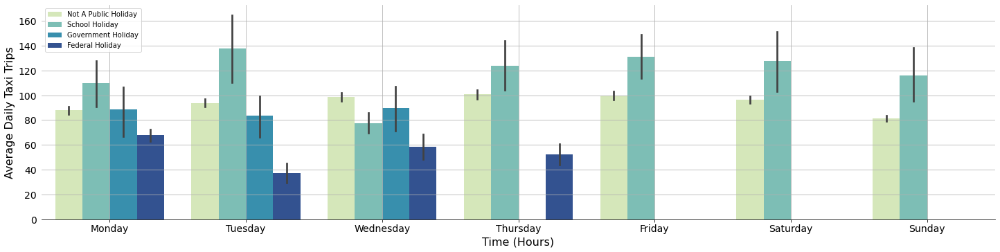

In [116]:
# Display a barplot of average daily taxi trips vs holidays categeogies for every day of the week
plot_barplot(
    pickup_count_holidays,
    x_var="pickup_weekday",
    y_var="count",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Daily Taxi Trips",
)

**Note:** the bar plot above shows the average number of daily taxi trips for each day of the week and each holidays category. The average number of cab trips is marginally lower for federal holidays for each week days.

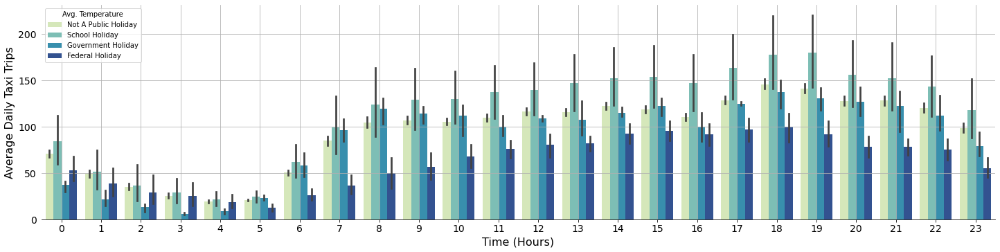

In [117]:
# Display a barplot of average daily taxi trips vs hour of day for all average temperature levels
plot_barplot(
    pickup_count_holidays,
    x_var="pickup_hour",
    y_var="count",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature"
)

**Note:** the bar plot above shows the average number daily of taxi trips for each hour of the day and each holidays category. The average number of cab trips is lower during the peak hours.

In [118]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature levels
# Compute the mean of trip distances and durations
pickup_avg_holidays = (
    train_df.groupby(
        ["pickup_yearday", "pickup_weekday", "pickup_hour", "holiday", "holiday_type"]
    )
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
).sort_values(["holiday_type", "pickup_weekday"])

# Compute the average trip speed
pickup_avg_holidays["trip_speed"] = np.divide(
    pickup_avg_holidays["trip_distance"],
    np.divide(pickup_avg_holidays["trip_duration"], 60),
)

# Replace numerical values by the name of the categories
pickup_avg_holidays["holiday_type"] = pickup_avg_holidays["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            holidays_type,
        )
    )
)

# Replace numerical values by the name of the categories
pickup_avg_holidays["pickup_weekday"] = pickup_avg_holidays["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_holidays[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


**Note:**

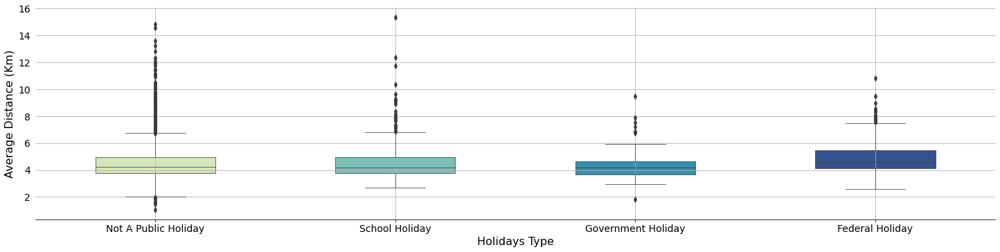

In [119]:
# Display a boxplot of average trip distance vs hour of day for all average temperature levels
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_distance",
    xlabel="Holidays Type",
    ylabel="Average Distance (Km)",
)

**Note:** The boxplot above shows the average daily distance traveled for each holiday cateogry. The average distance traveled is marginally higher for federal holiday.

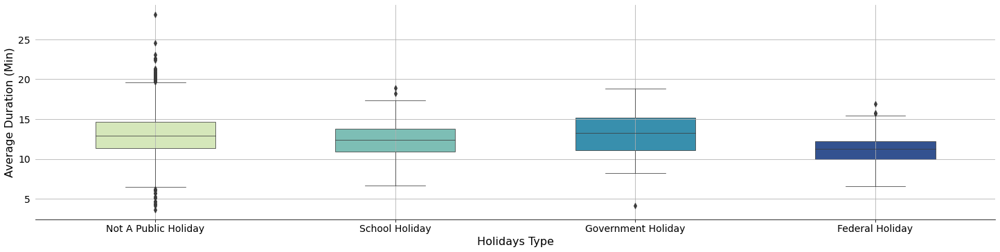

In [120]:
# Display a boxplot of average trip duration vs hour of day for all average temperature levels
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_duration",
    xlabel="Holidays Type",
    ylabel="Average Duration (Min)",
)

**Note:** The boxplot above shows the average daily travel duration for each holiday cateogry. The average distance traveled is lower for federal holidays.

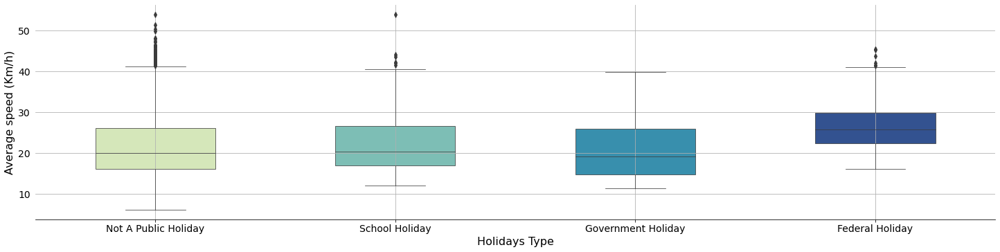

In [121]:
# Display a boxplot of average trip duration vs types of holidays
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_speed",
    xlabel="Holidays Type",
    ylabel="Average speed (Km/h)",
)

**Note:** The boxplot above shows the average daily travel duration for each holiday cateogry. The average distance traveled is higher for federal holiday.

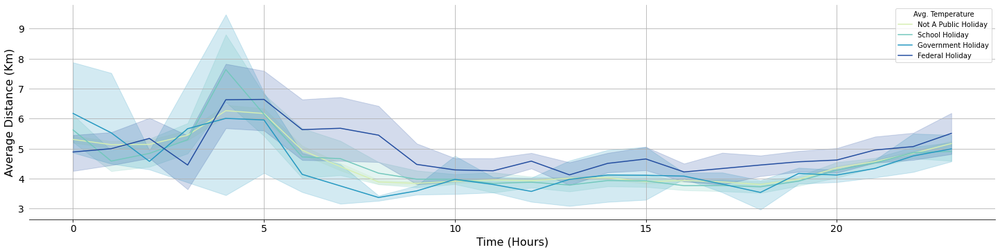

In [122]:
# Display a lineplot of average trip distance vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature"
)

**Note:** The line plot above shows the average daily distance traveled for each hour of day and each holiday cateogry. The average distance traveled is marginally higher for federal holiday.

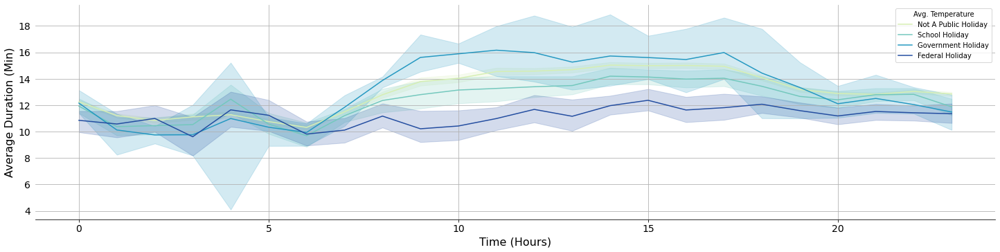

In [123]:
# Display a lineplot of average trip duration vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature"
)

**Note:** The line plot above shows the average daily travel duration for each hour of day and each holiday cateogry. The average travel time is lower for federal holidays during peak hours, and conversely higher for school vacations. The large variation observed for school holidays is due to the difference in ridership observed between traditional school vacations and spring breaks. We have previously observed that the number of traxi trips, and thus indirectly traffic congestion in the city, increases sharply in March. 

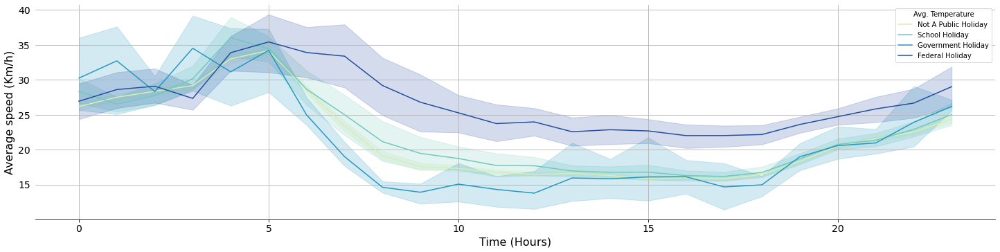

In [124]:
# Display a lineplot of average trip duration vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature"
)

**Note:** The line plot above shows the average daily travel speed for each hour of day and each holiday cateogry. The average travel speed is higher for federal holidays during peak hours, and conversely lower for school vacations. As previously stated, The large variation observed for school holidays is due to the difference in ridership observed between traditional school vacations and spring breaks. The exact causes leading to these increases and decreases are  many and varied, and investigation of each possible cause is beyond the scope of this work.

## 2.3.1 Correlation Analysis of Combined Data 
### Goal:
Measure the strength of the linear relationship between every feature of the dataset.
### Code:

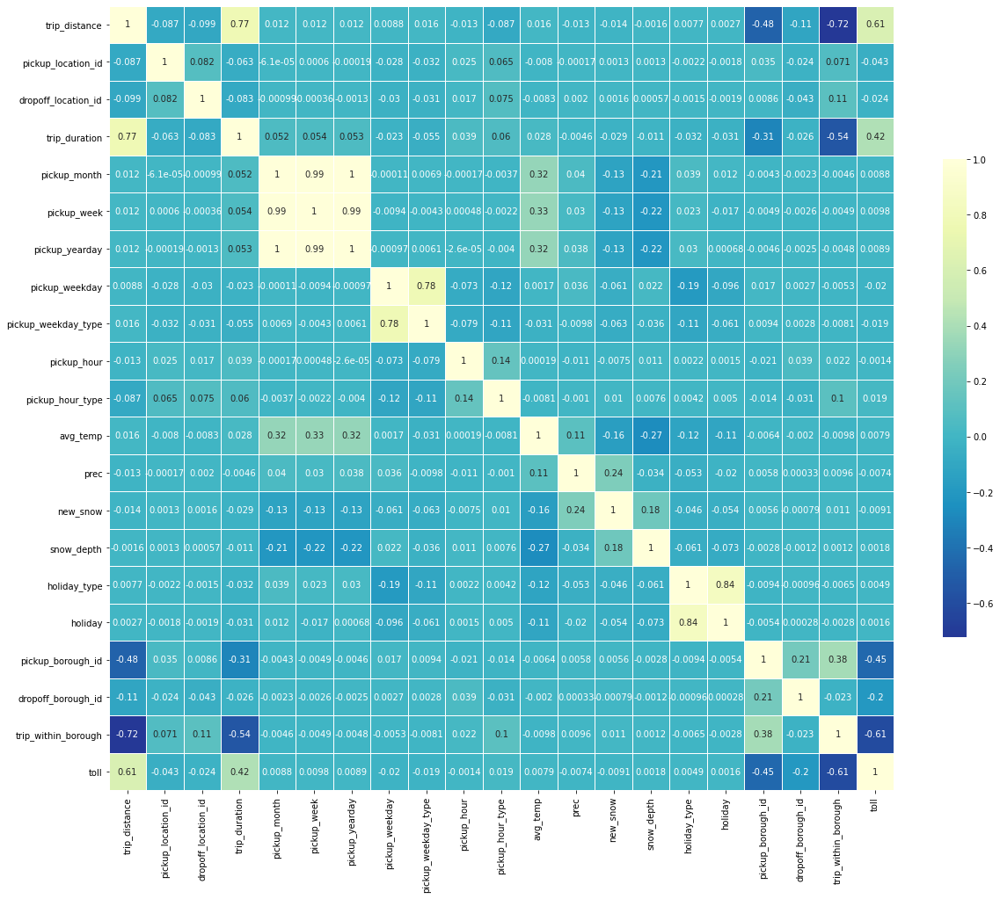

In [125]:
# Display a heatmap of the correlation matrix for all features of the data frame
plot_corrmap(train_df.corr())

One-hot encoding is a common transformation for features that have non-linear relationships with the target to add more flexibility to linear models. So, applying one-hot encoding to discrete features can be beneficial in some cases. For continuous features that don't have a linear relationship with the target, you can experiment with polynomial features. Another approach would be to first "bin" the continuous feature (for example, using the pandas.qcut() function) and then apply one-hot encoding. Applying one-hot encoding to a (discrete or binned) feature will split the variable into several (binary) features that can take 0 or 1 values. In this case, a linear model will predict a constant value for each of these binary features, which corresponds to each (binary) feature's mean target value.

If there is no natural ordering in the categorical feature, you can one-hot encode this feature. If the feature has a natural ordering

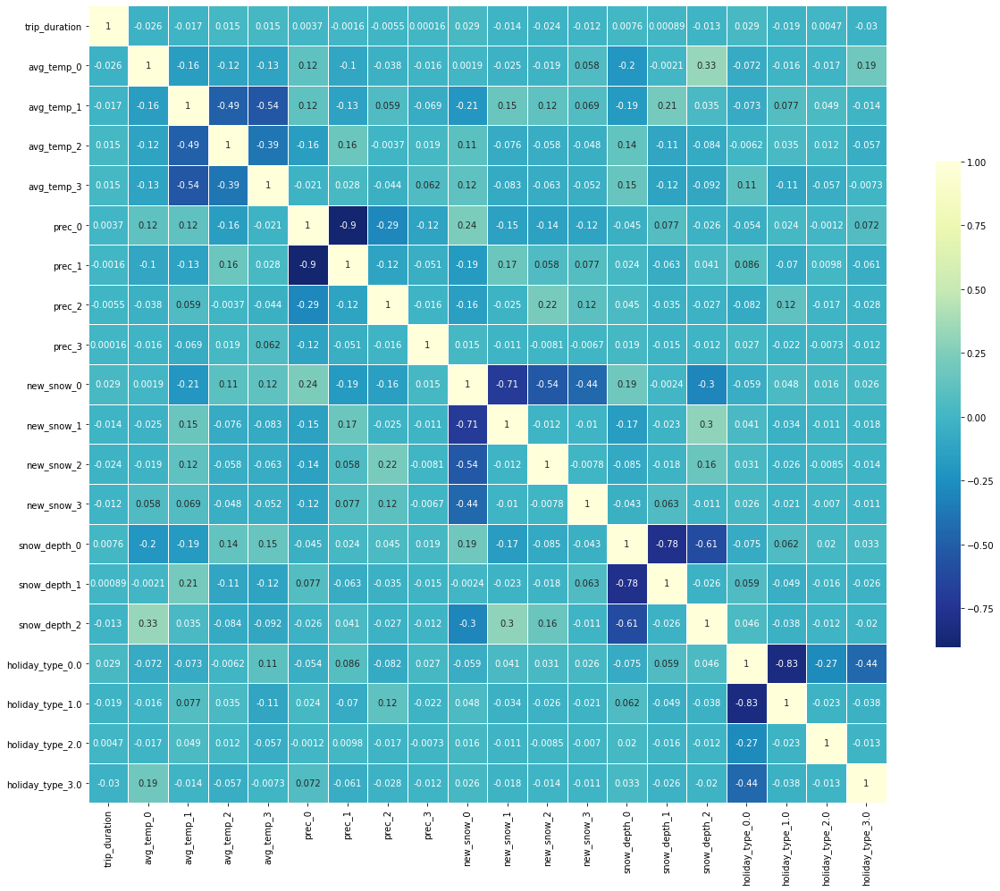

In [126]:
# Get a subset of the data frame with trip duration, and weather and holidays columns
weather_subset = train_df[
    ["avg_temp", "prec", "new_snow", "snow_depth", "holiday_type","trip_duration"]
]

# One-Hot encode selected columns of the subset data frame
weather_subset_enc = pd.get_dummies(
    weather_subset, columns=["avg_temp", "prec", "new_snow", "snow_depth", "holiday_type"]
)

# Display a heatmap of the correlation matrix of one-hot encoded all features of the data frame
plot_corrmap(weather_subset_enc.corr())

In [127]:
https://towardsdatascience.com/one-hot-encoding-is-making-your-tree-based-ensembles-worse-heres-why-d64b282b5769

SyntaxError: invalid syntax (3919224410.py, line 1)

***
## Data Export